In [2]:
import pickle

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os 

from plotting_celltypes_new import get_animal_clean_dict_activity, fit_GLM_population, get_residual_activity_dict, preprocess_animal, reshape_contig_dict, get_cp_dict, get_labels_all_different_Ks_single
filepath = "/Users/michaelfinch/CA1-interneuron-GLM/datasets/NDNF_E0A1B1_251107.mat"
animal_clean_dict_activity, factors_dict_NDNF, _, _, _, animal_lick_dict = get_animal_clean_dict_activity(filepath, use_final=True)
GLM_params_NDNF, predicted_activity_dict = fit_GLM_population(factors_dict_NDNF, animal_clean_dict_activity, quintile=None, regression='ridge', alphas=None)
residual_activity_dict_NDNF = get_residual_activity_dict(animal_clean_dict_activity, predicted_activity_dict)

clean_resid_activity_dict_NDNF_newest = {}

clean_velocity_dict_NDNF_newest = {}

clean_lick_dict_NDNF_newest = {}

for idx, animal in enumerate(residual_activity_dict_NDNF):
    if 14 < idx < 29:
        clean_resid_activity_dict_NDNF_newest[f"animal_{idx+1}"] = residual_activity_dict_NDNF[animal]
        clean_velocity_dict_NDNF_newest[f"animal_{idx+1}"] = factors_dict_NDNF[animal]
        clean_lick_dict_NDNF_newest [f"animal_{idx+1}"] = animal_lick_dict[animal]

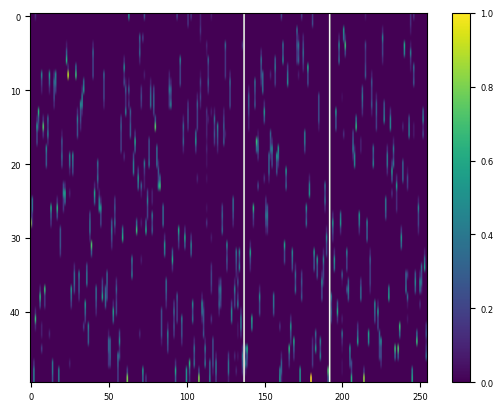

In [59]:
plt.imshow(animal_lick_dict["animal_1"]["Licks"], aspect='auto')
plt.colorbar()

In [4]:
with open('/Users/michaelfinch/CA1-interneuron-GLM/datasets/NDNF_fixed_model_dict_clean.pkl', 'rb') as f:
    NDNF_model_dict_clean  = pickle.load(f)

save_path = '/Users/michaelfinch/CA1-interneuron-GLM/datasets/all_cells_truncated_fixed_model.pkl'
with open(save_path, 'rb') as f:
    sliceTCA_model = pickle.load(f)

In [5]:
contig_dict_all_cell_tca = preprocess_animal(NDNF_model_dict_clean, clean_resid_activity_dict_NDNF_newest, num_clusters=5, reassign_clusters=False, x00=True, umap=False, contiguous=True, ranks=20)


contig_dict = reshape_contig_dict(contig_dict_all_cell_tca, NDNF_model_dict_clean)



cp_dict_NDNF = get_cp_dict(contig_dict)



labels_dict_raw_new = get_labels_all_different_Ks_single(sliceTCA_model, which_vectors=1)

Using breakpoint clustering (clusters = 1)
Using breakpoint clustering (clusters = 2)
Using breakpoint clustering (clusters = 3)
Using breakpoint clustering (clusters = 4)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 223 trials
After reassignment:
  Cluster 0: 223 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 140 trials
  Cluster 1: 83 trials
After reassignment:
  Cluster 0: 140 trials
  Cluster 1: 83 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 140 trials
  Cluster 1: 50 trials
  Cluster 2: 33 trials
After reassignment:
  Cluster 0: 140 trials
  Cluster 1: 50 trials
  Cluster 2: 33 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 140 trials
  Cluster 1: 40 trials
  Cluster 2: 10 trials
  Cluster 3: 33 trials
After reassignment:
  Cluster 0: 140 trials
  Cluster 1: 40 trials
  Cluster 2: 10 trials
  Cluster 3: 33 trials
Using breakpoint clustering (clusters = 1)
Using breakpoint clustering (clusters = 2)
Using

/Users/michaelfinch/miniconda3/envs/ca1_env/lib/python3.11/site-packages/threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


In [ ]:
labels = labels_dict_raw_new[2]
cell_type_0 = np.where(labels==0)[0]
cell_type_1 = np.where(labels==1)[0]

In [26]:
print(cell_type_0)

[  0   1   2   3   4   5   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  34  36  37  38  39  40
  41  64  65  66  68  69  70  71  72  73  74  75  76  77  78  79  80  82
  84  85  86  87  89  91  96  97  98 100 101 104 113 114 115 116 117 119
 122 123 128 135 141 146 148 150 151 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173]


In [158]:
min_num_trials = 10000
for animal in clean_resid_activity_dict_NDNF_newest:
    for cell in clean_resid_activity_dict_NDNF_newest[animal]:
        if clean_resid_activity_dict_NDNF_newest[animal][cell].shape[1] < min_num_trials:
            min_num_trials = clean_resid_activity_dict_NDNF_newest[animal][cell].shape[1]


In [159]:
data_celltype0 = []
data_celltype1 = []

count = 0
for animal in clean_resid_activity_dict_NDNF_newest:
    for cell in clean_resid_activity_dict_NDNF_newest[animal]:
        if count in cell_type_0:
            data_celltype0.append(clean_resid_activity_dict_NDNF_newest[animal][cell][:,:min_num_trials])
        else:
            data_celltype1.append(clean_resid_activity_dict_NDNF_newest[animal][cell][:,:min_num_trials])

        count+=1



print(data_celltype0)

[array([[-0.05971249, -0.44588161, -0.21187927, ..., -0.08380572,
         0.36566407,  0.10872393],
       [-0.18292731, -0.03645562, -0.50068436, ...,  0.1659178 ,
         0.36258868,  0.1687803 ],
       [-0.11170185, -0.45256678, -0.52267296, ...,  0.23833753,
        -0.11778296,  0.16417492],
       ...,
       [ 0.11560525, -0.09490637, -0.92743076, ..., -0.02184735,
         0.84410724,  0.44550991],
       [ 0.26673736, -0.36102992, -0.33442165, ...,  0.22863126,
         0.71957227, -0.04250385],
       [-0.04753079, -0.66374918, -0.50327236, ...,  0.09961386,
         0.27242235,  0.1652209 ]]), array([[-0.05971249, -0.44588161, -0.21187927, ..., -0.08380572,
         0.36566407,  0.10872393],
       [-0.18292731, -0.03645562, -0.50068436, ...,  0.1659178 ,
         0.36258868,  0.1687803 ],
       [-0.11170185, -0.45256678, -0.52267296, ...,  0.23833753,
        -0.11778296,  0.16417492],
       ...,
       [ 0.11560525, -0.09490637, -0.92743076, ..., -0.02184735,
        

In [160]:
data_celltype0_array = np.array(data_celltype0)
data_celltype1_array = np.array(data_celltype1)


In [162]:
import torch
type_0_array = data_celltype0_array.transpose(2,0,1)
type_0_tensor = torch.from_numpy(type_0_array)
type_0_tensor.shape

torch.Size([94, 101, 50])

In [163]:
type_1_array = data_celltype1_array.transpose(2,0,1)
type_1_tensor = torch.from_numpy(type_1_array)
type_1_tensor.shape

torch.Size([94, 73, 50])

In [126]:
model_type_0

SliceTCA(
  (vectors): ModuleList(
    (0): ParameterList(
        (0): Parameter containing: [torch.float32 of size 20x94]
        (1): Parameter containing: [torch.float32 of size 20x101x50]
    )
    (1): ParameterList(
        (0): Parameter containing: [torch.float32 of size 0x101]
        (1): Parameter containing: [torch.float32 of size 0x94x50]
    )
    (2): ParameterList(
        (0): Parameter containing: [torch.float32 of size 0x50]
        (1): Parameter containing: [torch.float32 of size 0x94x101]
    )
  )
)

In [156]:
type_0_tensor.shape

NameError: name 'type_0_tensor' is not defined

In [27]:
trial_components = 20
min_train_steps = 2500
learning_rate = 3*10**-3
weight_decay = 0.1


components_type_0, model_type_0 = slicetca.decompose(type_0_tensor,
                                    number_components=(trial_components,0,0), # (trials, neurons, time bins)
                                    positive=False,
                                    learning_rate=learning_rate,
                                    min_std=1**-10,
                                    iter_std=min_train_steps,
                                    max_iter=4_000,
                                    weight_decay=weight_decay,
                                    seed=0)


The model converged. Loss: 0.45425948044518144 :  62%|██████▎   | 2500/4000 [02:07<01:16, 19.57it/s]


In [28]:
trial_components = 20
min_train_steps = 2500
learning_rate = 3*10**-3
weight_decay = 0.1


components_type_1, model_type_1 = slicetca.decompose(type_1_tensor,
                                    number_components=(trial_components,0,0), # (trials, neurons, time bins)
                                    positive=False,
                                    learning_rate=learning_rate,
                                    min_std=1**-10,
                                    iter_std=min_train_steps,
                                    max_iter=4_000,
                                    weight_decay=weight_decay,
                                    seed=0)


The model converged. Loss: 0.37806710798380183 :  62%|██████▎   | 2500/4000 [01:20<00:48, 31.17it/s]


In [29]:
model_type_0_reconstructed = model_type_0.construct()
model_type_0_reconstructed.shape
MSE_0 = torch.mean(torch.square(model_type_0_reconstructed - type_0_tensor))

print(MSE_0)

tensor(0.4543, dtype=torch.float64, grad_fn=<MeanBackward0>)


In [30]:
model_type_1_reconstructed = model_type_1.construct()
model_type_1_reconstructed.shape
MSE_1 = torch.mean(torch.square(model_type_1_reconstructed - type_1_tensor))

print(MSE_1)

tensor(0.3781, dtype=torch.float64, grad_fn=<MeanBackward0>)


In [57]:
# model_type_1_reconstructed = model_type_1_reconstructed.numpy(force=True)
# model_type_0_reconstructed = model_type_0_reconstructed.numpy(force=True)

raw_data_1 = type_1_tensor.numpy(force=True)
raw_data_0 = type_0_tensor.numpy(force=True)

In [64]:
MSE_per_cell_list_0 = []

for cell in range(model_type_0_reconstructed.shape[1]):
    reco_data = model_type_0_reconstructed[:,cell,:]
    raw_data_0_cell = raw_data_0[:,cell,:]
    MSE_cell = np.mean(np.square(reco_data -raw_data_0_cell))
    MSE_per_cell_list_0.append(MSE_cell)




In [116]:
def get_MSE_per_cell_list(model_type_1_reconstructed):
    MSE_per_cell_list_1 = []

    for cell in range(model_type_1_reconstructed.shape[1]):
        reco_data = model_type_1_reconstructed[:,cell,:]
        raw_data_1_cell = raw_data_1[:,cell,:]
        MSE_cell = np.mean(np.square(reco_data -raw_data_1_cell))
        MSE_per_cell_list_1.append(MSE_cell)

    return MSE_per_cell_list_1




In [111]:
X0.shape

(4700, 101)

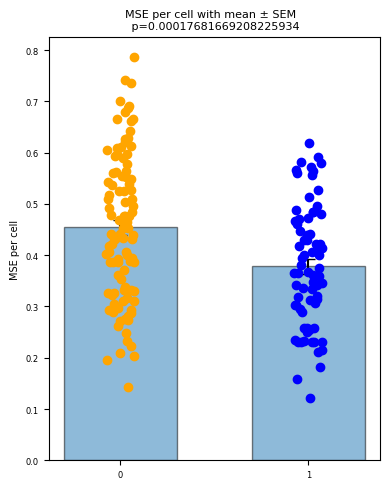

In [ ]:

data = [MSE_per_cell_list_0, MSE_per_cell_list_1]

def plot_MSEs(data, title="MSE per cell with mean ± SEM"):
    means = [np.mean(d) for d in data]
    # standard error of the mean
    errs  = [np.std(d, ddof=1) / np.sqrt(len(d)) for d in data]

    x = np.arange(2)

    fig, ax = plt.subplots(figsize=(4, 5))

    colors = ["orange", "blue"]

    # bars with error bars + horizontal caps
    ax.bar(
        x,
        means,
        yerr=errs,
        width=0.6,
        alpha=0.5,
        edgecolor="black",
        capsize=5,              # this gives you the little horizontal caps
        error_kw=dict(capthick=1)
    )

    # overlay individual data points with horizontal jitter
    for i, vals in enumerate(data):
        vals = np.asarray(vals)
        jitter = (np.random.rand(len(vals)) - 0.5) * 0.15
        ax.scatter(
            np.full(len(vals), x[i]) + jitter,
            vals,
            color=colors[i],
            zorder=3,
        )

    from scipy import stats
    t_statistic, p_value = stats.ttest_ind(data[0], data[1], equal_var=False)

    ax.set_xticks(x)
    ax.set_xticklabels(["0", "1"])
    ax.set_ylabel("MSE per cell")
    ax.set_title(f"{title} \n p={p_value}")


    plt.tight_layout()
    plt.show()


plot_MSEs(data)


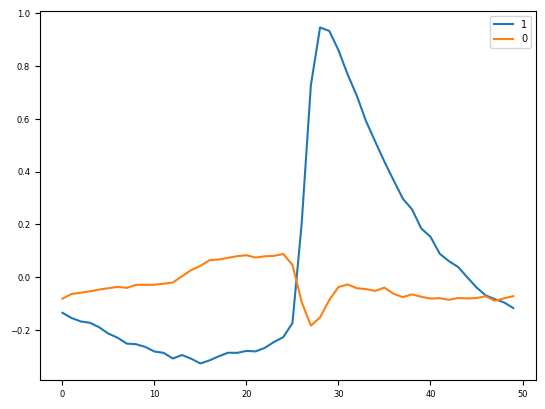

In [60]:
plt.plot(np.mean(data_celltype1_array, axis=(0,2)), label="1")
plt.plot(np.mean(data_celltype0_array, axis=(0,2)), label="0")
plt.legend()

In [82]:
components_type_1[0][0].shape

(20, 94)

X_all (94, 20)
X_all (94, 20)


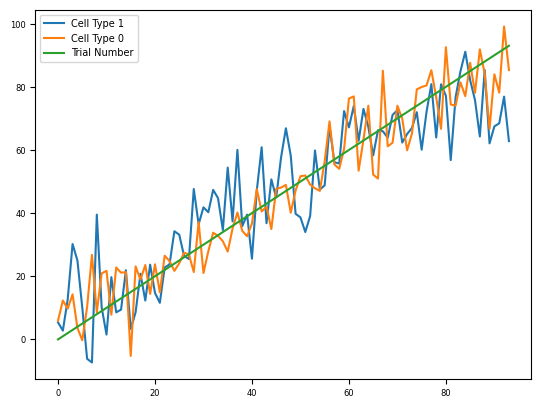

In [88]:
from sklearn.linear_model import LinearRegression

def get_predicted_trial_number(components_type_1):
    min_trials = 94

    X_all = components_type_1[0][0].T

    print(f"X_all {X_all.shape}")

    trial_idx = np.arange(min_trials)

    reg = LinearRegression()

    reg.fit(X_all, trial_idx)

    neuron_predicted_activity = reg.predict(X_all)

    return neuron_predicted_activity

neuron_predicted_trial_num_0 = get_predicted_trial_number(components_type_0)
neuron_predicted_trial_num_1 = get_predicted_trial_number(components_type_1)

truth = np.arange(94)

plt.plot(neuron_predicted_trial_num_1, label="Cell Type 1")
plt.plot(neuron_predicted_trial_num_0, label="Cell Type 0")
plt.plot(truth, label="Trial Number")
plt.legend()
# X_lda2 = X_all @ reg.coef_

In [99]:
def plot_bars_from_predicted(neuron_predicted_trial_num_0, neuron_predicted_trial_num_1):
    accuracy1_list = []
    accuracy0_list = []

    for i in range(94):
        accuracy1 = np.mean(np.square(i - neuron_predicted_trial_num_1[i]))
        accuracy0 = np.mean(np.square(i - neuron_predicted_trial_num_0[i]))

        accuracy1_list.append(accuracy1)
        accuracy0_list.append(accuracy0)

    data_reg_trial_num_pred = [accuracy0_list, accuracy1_list]

    plot_MSEs(data_reg_trial_num_pred)

In [97]:
def get_predicted_trial_number_no_tca(type_0_array_flat):
    min_trials = 94

    X_all = type_0_array_flat

    print(f"X_all {X_all.shape}")

    trial_idx = np.arange(min_trials)

    reg = LinearRegression()

    reg.fit(X_all, trial_idx)

    neuron_predicted_activity = reg.predict(X_all)

    return neuron_predicted_activity

In [ ]:
type_1_array = type_1_tensor.numpy(force=True)
type_0_array = type_0_tensor.numpy(force=True)

type_0_array_flat = type_0_array.reshape(type_0_array.shape[0], -1)
type_0_array_flat.shape

type_1_array_flat = type_1_array.reshape(type_1_array.shape[0], -1)
type_1_array_flat.shape




(94, 3650)

In [98]:
neuron_predicted_activity_no_tca_0 = get_predicted_trial_number_no_tca(type_0_array_flat)
neuron_predicted_activity_no_tca_1 = get_predicted_trial_number_no_tca(type_1_array_flat)

X_all (94, 5050)
X_all (94, 3650)


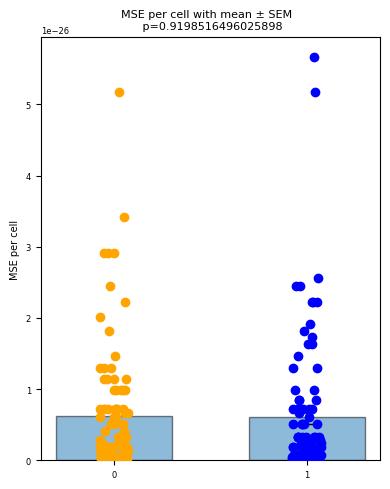

In [100]:
plot_bars_from_predicted(neuron_predicted_activity_no_tca_0, neuron_predicted_activity_no_tca_1)

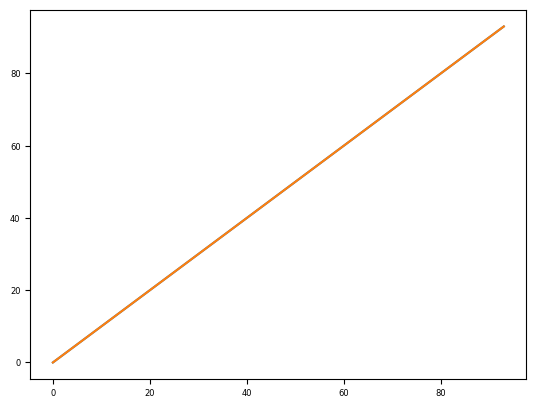

In [101]:
plt.plot(neuron_predicted_activity_no_tca_0)
plt.plot(neuron_predicted_activity_no_tca_1)

In [104]:
type_0_array = type_0_tensor.numpy(force=True)
type_1_array = type_1_tensor.numpy(force=True)

In [ ]:

rng = np.random.default_rng(SEED)

def shuffle_my_trials(data, rng):
    shuff = data.copy()
    n_trials, n_cells, n_pos = data.shape
    for c in range(n_cells):
        perm = rng.permutation(n_trials)
        shuff[:, c, :] = data[perm, c, :]

    return shuff


shuff_1 = shuffle_my_trials(type_0_array)
shuff_0 = shuffle_my_trials(type_1_array)


In [109]:
shuff_1.shape

(94, 101, 50)

In [112]:
np.allclose(shuff_1[:,0,:], type_0_array[:,0,:])   # should be False most of the time


False

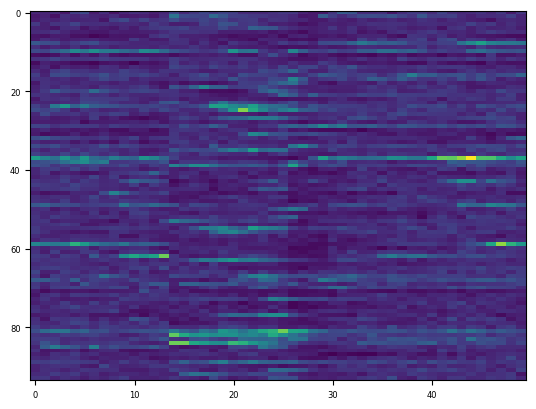

In [ ]:
plt.imshow(shuff_1[:,2,:], aspect='auto')

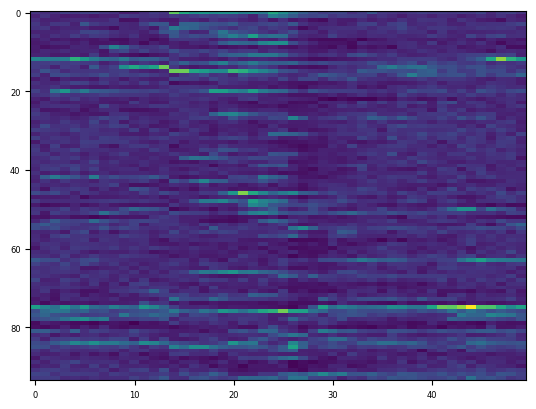

In [ ]:
plt.imshow(type_0_array[:,2,:], aspect='auto')


In [ ]:
shuff_1.shape

(94, 101, 50)

In [107]:
shuff_1_tensor = torch.from_numpy(shuff_1)
shuff_0_tensor = torch.from_numpy(shuff_0)

In [123]:
trial_components = 20
min_train_steps = 2500
learning_rate = 3*10**-3
weight_decay = 0.1


components_type_0_shuffled, model_type_0_shuffled = slicetca.decompose(shuff_0_tensor,
                                    number_components=(trial_components,0,0), # (trials, neurons, time bins)
                                    positive=False,
                                    learning_rate=learning_rate,
                                    min_std=1**-10,
                                    iter_std=min_train_steps,
                                    max_iter=4_000,
                                    weight_decay=weight_decay,
                                    seed=0)


The model converged. Loss: 0.47991966369554845 :  62%|██████▎   | 2500/4000 [01:20<00:48, 30.90it/s]


In [ ]:
trial_components = 20
min_train_steps = 2500
learning_rate = 3*10**-3
weight_decay = 0.1


components_type_1_shuffled, model_type_1_shuffled = slicetca.decompose(shuff_1_tensor,
                                    number_components=(trial_components,0,0), # (trials, neurons, time bins)
                                    positive=False,
                                    learning_rate=learning_rate,
                                    min_std=1**-10,
                                    iter_std=min_train_steps,
                                    max_iter=4_000,
                                    weight_decay=weight_decay,
                                    seed=0)


  0%|          | 0/4000 [00:00<?, ?it/s]

The model converged. Loss: 0.5427740907646553 :  62%|██████▎   | 2500/4000 [02:12<01:19, 18.92it/s]


In [168]:
models_for_celltypes_x00 = {"components_type_0":components_type_0,
                "model_type_0":model_type_0,
                "components_type_1":components_type_1,
                "model_type_1":model_type_1,
                "components_type_0_shuffled":components_type_0_shuffled,
                "model_type_0_shuffled":model_type_0_shuffled,
                "components_type_1_shuffled":components_type_1_shuffled,
                "model_type_1_shuffled":model_type_1_shuffled,
                }


save_path = '/Users/michaelfinch/CA1-interneuron-GLM/Clean_notebooks_to_date/ndnf_cell_types/models_for_celltypes_x00.pkl'  
with open(save_path, 'wb') as f:
    pickle.dump(models_for_celltypes_x00, f)

NameError: name 'components_type_0' is not defined

In [165]:
save_path = '/Users/michaelfinch/CA1-interneuron-GLM/Clean_notebooks_to_date/ndnf_cell_types/models_for_celltypes_x00.pkl'  
with open(save_path, 'rb') as f:
    models_for_celltypes_x00 = pickle.load(f)

In [ ]:
model_type_0 = models_for_celltypes_x00["model_type_0"]
model_type_1 = models_for_celltypes_x00["model_type_1"]

component_type_0 = models_for_celltypes_x00["components_type_0"]
component_type_1 = models_for_celltypes_x00["components_type_1"]

model_type_0_array = model_type_0.construct().numpy(force=True)
model_type_1_array = model_type_1.construct().numpy(force=True)



In [ ]:
component_type_0[0][0]

AttributeError: 'numpy.ndarray' object has no attribute 'type'

In [193]:
import ruptures as rpt

def get_cps(component_type_0):
    components_data = component_type_0[0][0].T

    model = rpt.Dynp(model="l2").fit(components_data)

    breakpoints = model.predict(n_bkps=2)
    change_points = breakpoints[:-1]

    return change_points

change_points0 = get_cps(component_type_0)
change_points1 = get_cps(component_type_1)


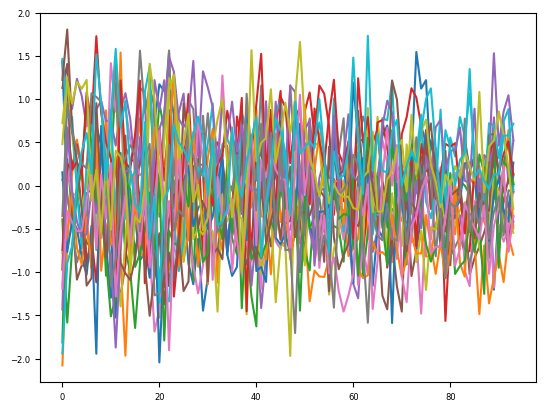

In [192]:
for i in range(component_type_1[0][0].shape[0]):
    plt.plot(component_type_1[0][0][i])
plt.show()

In [195]:
change_points0

[30, 75]

In [124]:
shuffled_model_type_0_reconstructed = model_type_0.construct()
shuffled_model_type_1_reconstructed = model_type_1.construct()

In [125]:
def get_predicted_trial_number(components_type_1):
    min_trials = 94

    X_all = components_type_1[0][0].T

    print(f"X_all {X_all.shape}")

    trial_idx = np.arange(min_trials)

    reg = LinearRegression()

    reg.fit(X_all, trial_idx)

    neuron_predicted_activity = reg.predict(X_all)

    return neuron_predicted_activity

shuffled_neuron_predicted_trial_num_0 = get_predicted_trial_number(components_type_0_shuffled)
shuffled_neuron_predicted_trial_num_1 = get_predicted_trial_number(components_type_1_shuffled)

X_all (94, 20)
X_all (94, 20)


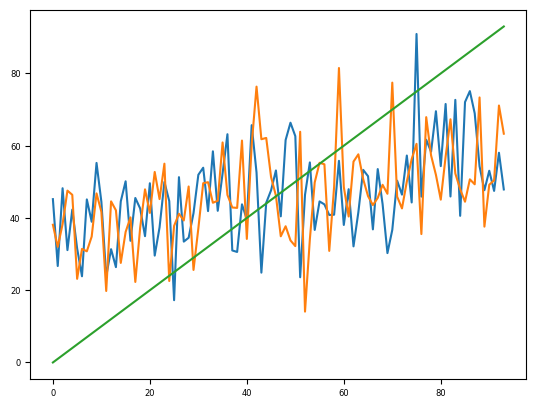

In [126]:
plt.plot(shuffled_neuron_predicted_trial_num_0)
plt.plot(shuffled_neuron_predicted_trial_num_1)
plt.plot(range(94))

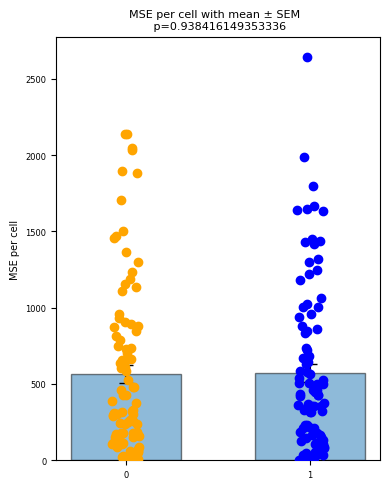

In [127]:
plot_bars_from_predicted(shuffled_neuron_predicted_trial_num_0, shuffled_neuron_predicted_trial_num_1)

In [15]:
import torch
import slicetca

In [13]:
data_list = []

for animal in clean_resid_activity_dict_NDNF_newest:
    for cell in clean_resid_activity_dict_NDNF_newest[animal]:
        data_list.append(clean_resid_activity_dict_NDNF_newest[animal][cell][:,:min_num_trials])


data_array = np.array(data_list)
data_array = torch.from_numpy(data_array)
data_array_reshaped = data_array.permute(2, 0, 1)
# data_array_reshaped = data_array.permute(2,0,1)
data_array_reshaped.shape

torch.Size([94, 174, 50])

In [16]:
trial_components = 20
min_train_steps = 2500
learning_rate = 3*10**-3
weight_decay = 0.1


components_type_444, model_type_444 = slicetca.decompose(data_array_reshaped,
                                    number_components=(4,4,4), # (trials, neurons, time bins)
                                    positive=False,
                                    learning_rate=learning_rate,
                                    min_std=1**-10,
                                    iter_std=min_train_steps,
                                    max_iter=4_000,
                                    weight_decay=weight_decay,
                                    seed=0)

The model converged. Loss: 0.22993241228977956 :  62%|██████▎   | 2500/4000 [03:08<01:53, 13.26it/s]


In [32]:
T0 = model_type_0.construct()              # (trials, cells, pos)
X0 = T0.permute(0, 2, 1).reshape(-1, T0.shape[1])

T1 = model_type_1.construct()
X1 = T1.permute(0, 2, 1).reshape(-1, T1.shape[1])

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 101 and the array at index 1 has size 73

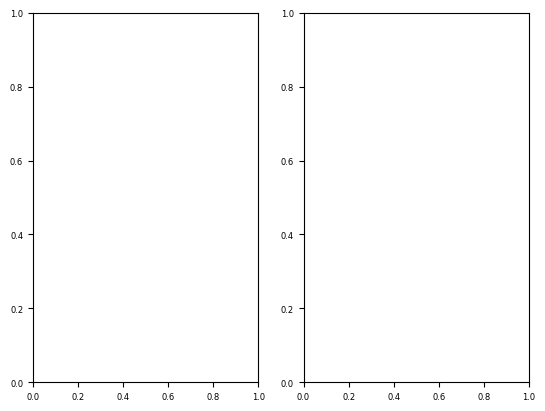

In [ ]:
fig, axs = plt.subplots(1,2)


from sklearn.decomposition import PCA

X0n = X0.cpu().numpy() if hasattr(X0, "cpu") else X0
X1n = X1.cpu().numpy() if hasattr(X1, "cpu") else X1

X_all = np.vstack([X0n, X1n])
pca = PCA(n_components=2).fit(X_all)

Z0 = pca.transform(X0n)
Z1 = pca.transform(X1n)



# from sklearn.decomposition import PCA
# pca0 = PCA(n_components=2)
# pca1 = PCA(n_components=2)

# n_pos=50
# n_trials=94

# # X0 = X0.numpy(force=True)
# # X1 = X1.numpy(force=True)

# Z0 = pca0.fit_transform(X0)   # (trials*pos, 2)
# Z1 = pca1.fit_transform(X1)   # (trials*pos, 2)

########### baseline subtraction ###

Z0_tp = Z0.reshape(94, n_pos, 2)
Z0_tp = Z0_tp - Z0_tp[:, :1, :]   # subtract each trial’s start point
Z0 = Z0_tp.reshape(-1, 2)

Z1_tp = Z1.reshape(94, n_pos, 2)
Z1_tp = Z1_tp - Z1_tp[:, :1, :]   # subtract each trial’s start point
Z1 = Z1_tp.reshape(-1, 2)


trial_idx = np.repeat(np.arange(n_trials), n_pos)
pos_idx   = np.tile(np.arange(n_pos), n_trials)

sc0 = axs[0].scatter(Z0[:,1], Z0[:,0],
                    c=pos_idx, cmap="viridis",
                    s=5, alpha=0.5, linewidths=0)

axs[0].set_ylabel("PC1- TCA")
axs[0].set_xlabel("PC2- TCA")

cbar0 = plt.colorbar(sc0, ax=axs[0], fraction=0.046, pad=0.04)
cbar0.set_label("Position bin")

sc1 = axs[1].scatter(Z1[:,1], Z1[:,0],
                    c=pos_idx, cmap="viridis",
                    s=5, alpha=0.5, linewidths=0)

axs[1].set_ylabel("PC1- TCA")
axs[1].set_xlabel("PC2- TCA")

cbar1 = plt.colorbar(sc1, ax=axs[1], fraction=0.046, pad=0.04)
cbar1.set_label("Position bin")

plt.tight_layout()
plt.show()

In [ ]:
import ruptures as rpt
reconstructed_array_0 = T0.numpy(force=True)
reconstructed_array_0.shape

# for cell in reconstructed_array_0.shape[1]:
#     data_array

(94, 101, 50)

In [127]:
with open('/Users/michaelfinch/CA1-interneuron-GLM/datasets/NDNF_fixed_model_dict_clean.pkl', 'rb') as f:
    NDNF_model_dict_clean  = pickle.load(f)


    
reassigned_dict = preprocess_animal(NDNF_model_dict_clean, clean_resid_activity_dict_NDNF_newest, num_clusters=8, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)

contig_dict_all_cell_tca = preprocess_animal(NDNF_model_dict_clean, clean_resid_activity_dict_NDNF_newest, num_clusters=5, reassign_clusters=False, x00=True, umap=False, contiguous=True, ranks=20)



contig_dict = reshape_contig_dict(contig_dict_all_cell_tca, NDNF_model_dict_clean)



cp_dict_NDNF = get_cp_dict(contig_dict)


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 223 trials
After reassignment:
  Cluster 0: 223 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 183 trials
  Cluster 1: 40 trials
After reassignment:
  Cluster 0: 183 trials
  Cluster 1: 40 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 71 trials
  Cluster 1: 22 trials
  Cluster 2: 130 trials
After reassignment:
  Cluster 0: 71 trials
  Cluster 1: 22 trials
  Cluster 2: 130 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 79 trials
  Cluster 1: 7 trials
  Cluster 2: 117 trials
  Cluster 3: 20 trials
After reassignment:
  Cluster 0: 79 trials
  Cluster 1: 7 trials
  Cluster 2: 117 trials
  Cluster 3: 20 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 77 trials
  Cluster 1: 6 trials
  Cluster 2: 119 trials
  Cluster 3: 20 trials
  Cluster 4: 1 trials
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 77 trials
  Cluster 1: 7 trials
  Cluste

In [145]:
labels_celltype = labels_dict_raw_new[2]

cell_type_0 = np.where(labels_celltype==0)[0]
cell_type_1 = np.where(labels_celltype==1)[0]

early_data = []
middle_data = []
late_data = []

overall_data = []

for idx, animal in enumerate(clean_resid_activity_dict_NDNF_newest):
    for idt, cell in enumerate(clean_resid_activity_dict_NDNF_newest[animal]):
        early_cp = cp_dict_NDNF[idx][idt][0]
        late_cp = cp_dict_NDNF[idx][idt][1]
        data_early = clean_resid_activity_dict_NDNF_newest[animal][cell][:,:early_cp]
        early_data.append(np.mean(data_early, axis=1))
        data_late = clean_resid_activity_dict_NDNF_newest[animal][cell][:,late_cp:]
        middle_data.append(np.mean(data_late, axis=1))
        data_middle = clean_resid_activity_dict_NDNF_newest[animal][cell][:,early_cp:late_cp]
        late_data.append(np.mean(data_middle, axis=1))
        overall_data.append(clean_resid_activity_dict_NDNF_newest[animal][cell][:,:94])
        

early_data_array = np.array(early_data)
early_data_array_0 = early_data_array[cell_type_0,:].T
early_data_array_1 = early_data_array[cell_type_1,:].T

middle_data_array = np.array(middle_data)
middle_data_array_0 = middle_data_array[cell_type_0,:].T
middle_data_array_1 = middle_data_array[cell_type_1,:].T

late_data_array = np.array(late_data)
late_data_array_0 = late_data_array[cell_type_0,:].T
late_data_array_1 = late_data_array[cell_type_1,:].T

overall_data_array = np.array(overall_data)
overall_data_array_0 = overall_data_array[cell_type_0,:].T
overall_data_array_1 = overall_data_array[cell_type_1,:].T


In [146]:
overall_data_array_0.shape

(94, 50, 101)

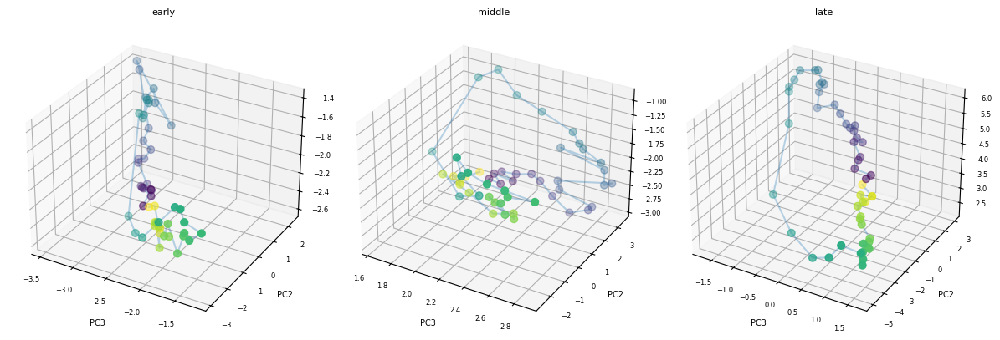

(49,)

In [47]:
from sklearn.decomposition import PCA
import numpy as np

# stack all epochs along samples axis
X_all = np.vstack([
    early_data_array_0,
    middle_data_array_0,
    late_data_array_0
])

pca = PCA(n_components=3)
pca.fit(X_all)

Z_early  = pca.transform(early_data_array_0)
Z_middle = pca.transform(middle_data_array_0)
Z_late   = pca.transform(late_data_array_0)

fig, axs = plt.subplots(
    1, 3, figsize=(12, 4),
    subplot_kw={"projection": "3d"}
)

Z_list = [Z_early, Z_middle, Z_late]
titles = ["early", "middle", "late"]

sc_last = None
for ax, Z, title in zip(axs, Z_list, titles):
    sc_last = ax.scatter(
        Z[:, 2], Z[:, 1], Z[:, 0],
        c=pos, cmap="viridis", s=40
    )
    ax.plot(Z[:, 2], Z[:, 1], Z[:, 0], alpha=0.3)

    ax.set_title(title)
    ax.set_xlabel("PC3")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC1")

# cbar = fig.colorbar(sc_last, ax=axs, location="right", pad=0.08, shrink=0.8)
# cbar.set_label("Position bin")


plt.tight_layout()
plt.show()

diff_pc3_list = []
diff_pc2_list = []
diff_pc1_list = []

for i in range(Z.shape[0]):
    if i < Z.shape[0]-1:
        pc3=Z[i, 2]
        pc3_next=Z[i+1, 2]
        diff_pc3 = pc3-pc3_next
        diff_pc3_list.append(diff_pc3)

        pc2=Z[i, 1]
        pc2_next=Z[i+1, 1]
        diff_pc2 = pc2-pc2_next
        diff_pc2_list.append(diff_pc2)

        pc1=Z[i, 0]
        pc1_next=Z[i+1, 0]
        diff_pc1 = pc1-pc1_next
        diff_pc1_list.append(diff_pc1)


summed_array  = np.vstack([diff_pc3_list,diff_pc2_list,diff_pc1_list])
summed_array = np.sum(summed_array, axis=0)
        
summed_array.shape

<BarContainer object of 49 artists>

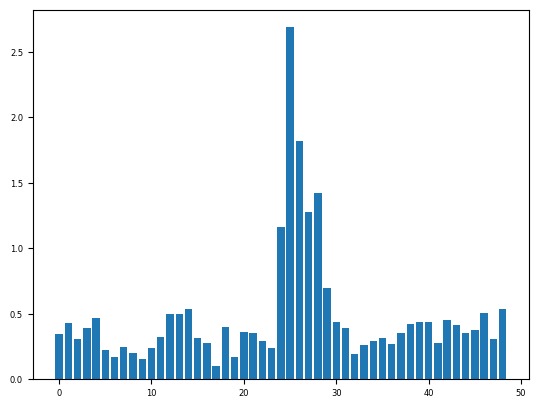

In [48]:
diffs = np.diff(Z, axis=0)                  # (n_points-1, 3)
euclid_dist = np.linalg.norm(diffs, axis=1)

plt.bar(range(49), euclid_dist)

X_all.shape (150, 101)
X_all.shape (150, 73)


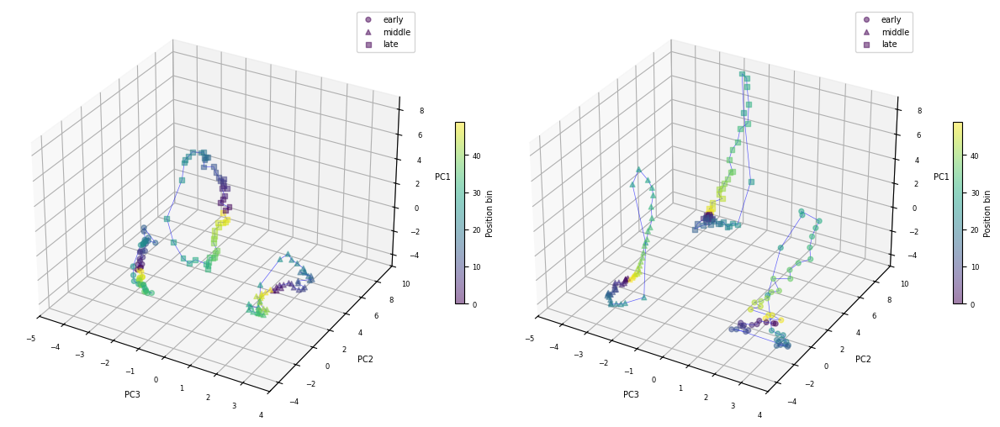

In [124]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def get_PCA_plot(X_all, X_early, X_middle, X_late, pos, ax):
    pca = PCA(n_components=3).fit(X_all)

    print(f"X_all.shape {X_all.shape}")

    Z_early  = pca.transform(X_early)
    Z_middle = pca.transform(X_middle)
    Z_late   = pca.transform(X_late)

    order = np.argsort(pos)  # so lines follow position

    sc = ax.scatter(Z_early[:,2],  Z_early[:,1],  Z_early[:,0],
                    c=pos, cmap="viridis", s=18, alpha=0.5, marker="o", label="early")
    ax.scatter(Z_middle[:,2], Z_middle[:,1], Z_middle[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="^", label="middle")
    ax.scatter(Z_late[:,2],   Z_late[:,1],   Z_late[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="s", label="late")

    ax.plot(Z_early[order,2],  Z_early[order,1],  Z_early[order,0],  alpha=0.6, lw=0.5, color='b')
    ax.plot(Z_middle[order,2], Z_middle[order,1], Z_middle[order,0], alpha=0.6, lw=0.5, color='b')
    ax.plot(Z_late[order,2],   Z_late[order,1],   Z_late[order,0],   alpha=0.6, lw=0.5, color='b')

    ax.set_xlabel("PC3"); ax.set_ylabel("PC2"); ax.set_zlabel("PC1")
    ax.set_xlim(-5,4); ax.set_ylim(-5,10); ax.set_zlim(-5,9)
    ax.legend()
    return sc  # return mappable for colorbar

# --- build X_all for each dataset ---
X_all_0 = np.vstack([early_data_array_0, middle_data_array_0, late_data_array_0])
X_all_1 = np.vstack([early_data_array_1, middle_data_array_1, late_data_array_1])

# --- make 1x2 3D axes correctly ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={"projection": "3d"})

sc0 = get_PCA_plot(X_all_0, early_data_array_0, middle_data_array_0, late_data_array_0, pos, axs[0])
sc1 = get_PCA_plot(X_all_1, early_data_array_1, middle_data_array_1, late_data_array_1, pos, axs[1])

# one shared colorbar (or do separate if you prefer)
cbar = fig.colorbar(sc1, ax=axs[1], pad=0.08, fraction=0.02)
cbar.set_label("Position bin")

cbar = fig.colorbar(sc0, ax=axs[0], pad=0.08, fraction=0.02)
cbar.set_label("Position bin")

plt.tight_layout()
plt.show()


In [150]:
overall_data_array.shape

(174, 50, 94)

In [207]:
transposed_array = model_type_0_array.transpose((0, 2, 1))
reshaped_array0 = transposed_array.reshape((-1, 101))
reshaped_array0.shape

(4700, 101)

In [ ]:
transposed_array = model_type_1_array.transpose((0, 2, 1))
reshaped_array1 = transposed_array.reshape((-1, 73))
reshaped_array1.shape



(94, 50, 3)

In [225]:
from scipy.stats import sem

(94, 50, 3)
mean_E_trial_data_array.shape (50, 3)
(20, 50, 3)
(94, 50, 3)
mean_E_trial_data_array.shape (50, 3)
(20, 50, 3)


<Figure size 640x480 with 0 Axes>

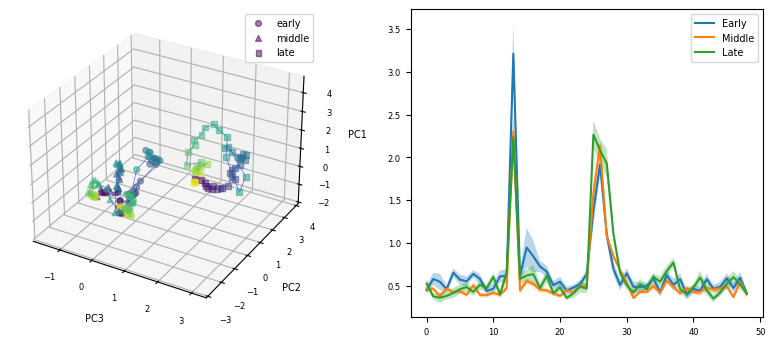

<Figure size 640x480 with 0 Axes>

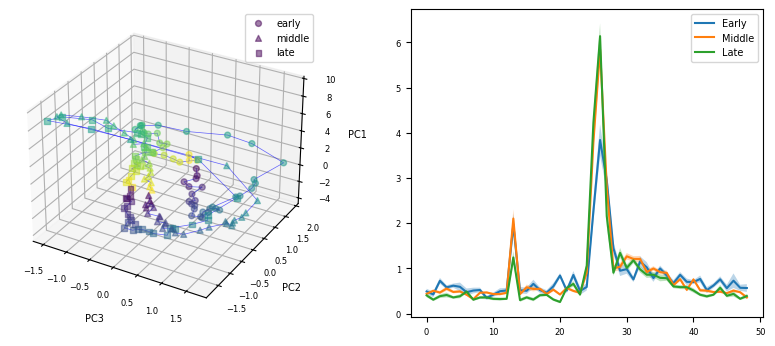

In [238]:
def plot_PCA_one_celltype(model_type_1_array):
    transposed = model_type_1_array.transpose(0, 2, 1) 
    n_trials, n_cells, n_pos = transposed.shape

    X = transposed.reshape(n_trials * n_cells, n_pos)

    pca = PCA(n_components=3).fit(X)
    Z = pca.transform(X)

    Z_reshaped = Z.reshape(n_trials, n_cells, 3) 
    print(Z_reshaped.shape)

    E_euc_dist_list = []
    M_euc_dist_list = []
    L_euc_dist_list = []

    E_trial_data = []
    M_trial_data = []
    L_trial_data = []


    for trial in range(Z_reshaped.shape[0]):
        trial_data = Z_reshaped[trial,:,:]

        diffs = np.diff(trial_data, axis=0)                  
        euclid_dist = np.linalg.norm(diffs, axis=1)
        
        if trial <20:
            E_euc_dist_list.append(euclid_dist)
            E_trial_data.append(trial_data)
        elif trial>73:
            L_euc_dist_list.append(euclid_dist)
            L_trial_data.append(trial_data)
        else:
            M_euc_dist_list.append(euclid_dist)
            M_trial_data.append(trial_data)

        
    E_euc_dist_array = np.array(E_euc_dist_list)
    mean_E_euc_dist_array = np.mean(E_euc_dist_array, axis=0)
    sem_E_euc_dist_array = sem(E_euc_dist_array, axis=0)

    M_euc_dist_array = np.array(M_euc_dist_list)
    mean_M_euc_dist_array = np.mean(M_euc_dist_array, axis=0)
    sem_M_euc_dist_array = sem(M_euc_dist_array, axis=0)

    L_euc_dist_array = np.array(L_euc_dist_list)
    mean_L_euc_dist_array = np.mean(L_euc_dist_array, axis=0)
    sem_L_euc_dist_array = sem(L_euc_dist_array, axis=0)

        
    fig, ax = plt.subplots(1,2)

    ax[0].remove()
    ax[1].remove()

    fig = plt.figure(figsize=(10,4))
    ax0 = fig.add_subplot(1, 2, 1, projection="3d")  # 3D
    ax1 = fig.add_subplot(1, 2, 2) 


    ax1.plot(mean_E_euc_dist_array, label="Early")
    ax1.fill_between(range(len(mean_E_euc_dist_array)), mean_E_euc_dist_array+sem_E_euc_dist_array, mean_E_euc_dist_array-sem_E_euc_dist_array, alpha=0.3)
    ax1.plot(mean_M_euc_dist_array, label="Middle")
    ax1.fill_between(range(len(mean_M_euc_dist_array)), mean_M_euc_dist_array+sem_M_euc_dist_array, mean_M_euc_dist_array-sem_M_euc_dist_array, alpha=0.3)
    ax1.plot(mean_L_euc_dist_array, label="Late")
    ax1.fill_between(range(len(mean_L_euc_dist_array)), mean_L_euc_dist_array+sem_L_euc_dist_array, mean_L_euc_dist_array-sem_L_euc_dist_array, alpha=0.3)
    ax1.legend()

    E_trial_data_array = np.array(E_trial_data) 
    mean_E_trial_data_array = np.mean(E_trial_data_array, axis=0) 

    print(f"mean_E_trial_data_array.shape {mean_E_trial_data_array.shape}")

    M_trial_data_array = np.array(M_trial_data)
    mean_M_trial_data_array = np.mean(M_trial_data_array, axis=0) 

    L_trial_data_array = np.array(L_trial_data) 
    mean_L_trial_data_array = np.mean(L_trial_data_array, axis=0) 


    print(E_trial_data_array.shape)

    pos = np.arange(50)

    order = np.argsort(pos)  # so lines follow position


    sc = ax0.scatter(mean_E_trial_data_array[:,2],  mean_E_trial_data_array[:,1],  mean_E_trial_data_array[:,0],
                    c=pos, cmap="viridis", s=18, alpha=0.5, marker="o", label="early")
    ax0.scatter(mean_M_trial_data_array[:,2], mean_M_trial_data_array[:,1], mean_M_trial_data_array[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="^", label="middle")
    ax0.scatter(mean_L_trial_data_array[:,2],   mean_L_trial_data_array[:,1],   mean_L_trial_data_array[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="s", label="late")

    ax0.plot(mean_E_trial_data_array[order,2],  mean_E_trial_data_array[order,1],  mean_E_trial_data_array[order,0],  alpha=0.6, lw=0.5, color='b')
    ax0.plot(mean_M_trial_data_array[order,2], mean_M_trial_data_array[order,1], mean_M_trial_data_array[order,0], alpha=0.6, lw=0.5, color='b')
    ax0.plot(mean_L_trial_data_array[order,2],   mean_L_trial_data_array[order,1],   mean_L_trial_data_array[order,0],   alpha=0.6, lw=0.5, color='b')

    ax0.set_xlabel("PC3"); ax0.set_ylabel("PC2"); ax0.set_zlabel("PC1")
    # ax0.set_xlim(-5,4); ax0.set_ylim(-5,10); ax0.set_zlim(-5,9)
    ax0.legend()
    return sc  # return mappable for colorbar

# fig, axs= plt.subplots(1,2)
plot_PCA_one_celltype(model_type_0_array)
plot_PCA_one_celltype(model_type_1_array)



Z.shape (94, 50, 3)


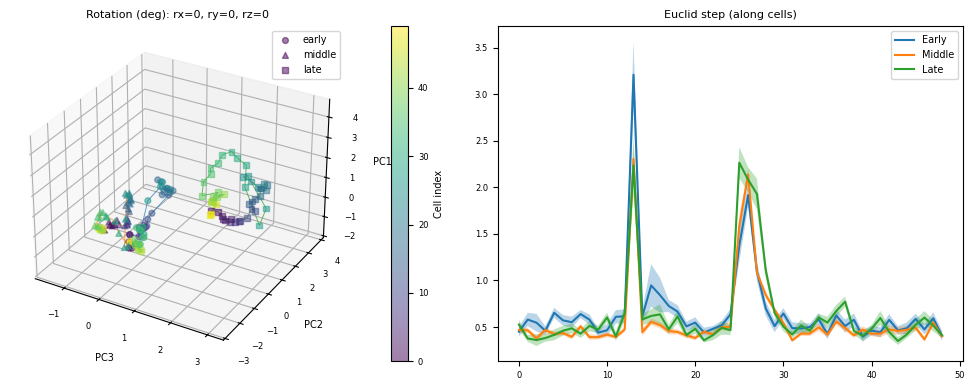

Z.shape (94, 50, 3)


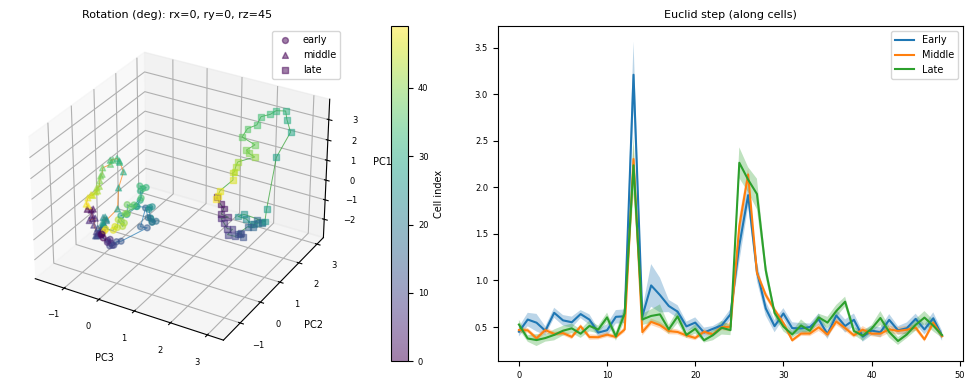

Z.shape (94, 50, 3)


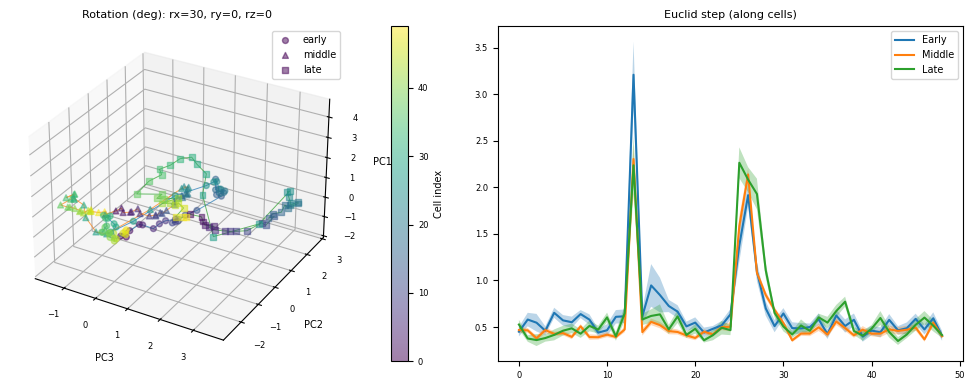

Z.shape (94, 50, 3)


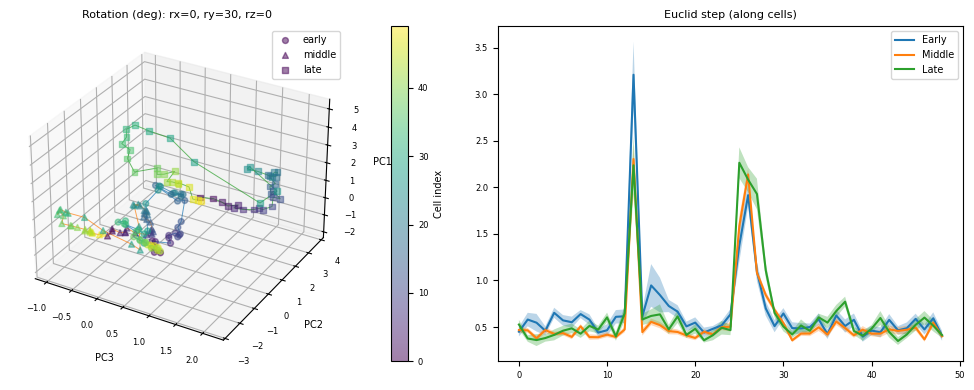

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.stats import sem

def rotmat_xyz(rx_deg=0, ry_deg=0, rz_deg=0):
    """Rotation matrix for rotating points in 3D PCA space.
    Applies Rx then Ry then Rz (you can change order if you want)."""
    rx, ry, rz = np.deg2rad([rx_deg, ry_deg, rz_deg])

    Rx = np.array([[1, 0, 0],
                   [0, np.cos(rx), -np.sin(rx)],
                   [0, np.sin(rx),  np.cos(rx)]])

    Ry = np.array([[ np.cos(ry), 0, np.sin(ry)],
                   [0, 1, 0],
                   [-np.sin(ry), 0, np.cos(ry)]])

    Rz = np.array([[np.cos(rz), -np.sin(rz), 0],
                   [np.sin(rz),  np.cos(rz), 0],
                   [0, 0, 1]])

    return Rz @ Ry @ Rx

def plot_PCA_one_celltype(model_type_array, rot_deg=(0,0,0), n_early=20, late_start=74):
    transposed = model_type_array.transpose(0, 2, 1)   # (trial, cell, pos)
    n_trials, n_cells, n_pos = transposed.shape

    X = transposed.reshape(n_trials * n_cells, n_pos)
    pca = PCA(n_components=3).fit(X)
    Z = pca.transform(X).reshape(n_trials, n_cells, 3) # (trial, cell, PC)

    print(f"Z.shape {Z.shape}")

    # --- split trials and compute mean trajectories + euclid along cells ---
    E_d, M_d, L_d = [], [], []
    E_traj, M_traj, L_traj = [], [], []

    for t in range(n_trials):
        traj = Z[t]  # (cells, 3)

        # euclid step along cells
        d = np.linalg.norm(np.diff(traj, axis=0), axis=1)

        if t < n_early:
            E_d.append(d); E_traj.append(traj)
        elif t >= late_start:
            L_d.append(d); L_traj.append(traj)
        else:
            M_d.append(d); M_traj.append(traj)

    E_d = np.asarray(E_d); M_d = np.asarray(M_d); L_d = np.asarray(L_d)

    meanE, semE = E_d.mean(axis=0), sem(E_d, axis=0)
    meanM, semM = M_d.mean(axis=0), sem(M_d, axis=0)
    meanL, semL = L_d.mean(axis=0), sem(L_d, axis=0)

    mean_E = np.mean(np.asarray(E_traj), axis=0)  # (cells,3)
    mean_M = np.mean(np.asarray(M_traj), axis=0)
    mean_L = np.mean(np.asarray(L_traj), axis=0)

    # --- rotate in PCA space (same rotation for all phases) ---
    R = rotmat_xyz(*rot_deg)
    mean_Er = mean_E @ R.T
    mean_Mr = mean_M @ R.T
    mean_Lr = mean_L @ R.T

    # --- plot ---
    fig = plt.figure(figsize=(10,4))
    ax0 = fig.add_subplot(1, 2, 1, projection="3d")
    ax1 = fig.add_subplot(1, 2, 2)

    # distance panel
    x = np.arange(len(meanE))
    ax1.plot(meanE, label="Early");  ax1.fill_between(x, meanE-semE, meanE+semE, alpha=0.3)
    ax1.plot(meanM, label="Middle"); ax1.fill_between(x, meanM-semM, meanM+semM, alpha=0.3)
    ax1.plot(meanL, label="Late");   ax1.fill_between(x, meanL-semL, meanL+semL, alpha=0.3)
    ax1.set_title("Euclid step (along cells)")
    ax1.legend()

    # 3D panel (color by cell index; NOT position)
    cvals = np.arange(n_cells)
    order = np.argsort(cvals)

    sc = ax0.scatter(mean_Er[:,2], mean_Er[:,1], mean_Er[:,0],
                     c=cvals, cmap="viridis", s=18, alpha=0.5, marker="o", label="early")
    ax0.scatter(mean_Mr[:,2], mean_Mr[:,1], mean_Mr[:,0],
                c=cvals, cmap="viridis", s=18, alpha=0.5, marker="^", label="middle")
    ax0.scatter(mean_Lr[:,2], mean_Lr[:,1], mean_Lr[:,0],
                c=cvals, cmap="viridis", s=18, alpha=0.5, marker="s", label="late")

    ax0.plot(mean_Er[order,2], mean_Er[order,1], mean_Er[order,0], alpha=0.7, lw=0.7)
    ax0.plot(mean_Mr[order,2], mean_Mr[order,1], mean_Mr[order,0], alpha=0.7, lw=0.7)
    ax0.plot(mean_Lr[order,2], mean_Lr[order,1], mean_Lr[order,0], alpha=0.7, lw=0.7)

    ax0.set_xlabel("PC3"); ax0.set_ylabel("PC2"); ax0.set_zlabel("PC1")
    ax0.set_title(f"Rotation (deg): rx={rot_deg[0]}, ry={rot_deg[1]}, rz={rot_deg[2]}")
    ax0.legend()
    fig.colorbar(sc, ax=ax0, pad=0.1).set_label("Cell index")

    plt.tight_layout()
    plt.show()

    return sc


plot_PCA_one_celltype(model_type_0_array, rot_deg=(0,0,0))
plot_PCA_one_celltype(model_type_0_array, rot_deg=(0,0,45))
plot_PCA_one_celltype(model_type_0_array, rot_deg=(30,0,0))
plot_PCA_one_celltype(model_type_0_array, rot_deg=(0,30,0))



(94, 50, 3)


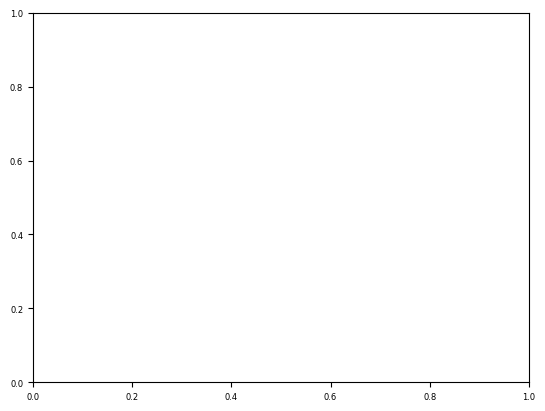

In [252]:
def plot_PCA_one_celltype(model_type_1_array, ax0):
    transposed = model_type_1_array.transpose(0, 2, 1) 
    n_trials, n_cells, n_pos = transposed.shape

    X = transposed.reshape(n_trials * n_cells, n_pos)

    pca = PCA(n_components=3).fit(X)
    Z = pca.transform(X)

    Z_reshaped = Z.reshape(n_trials, n_cells, 3) 
    print(Z_reshaped.shape)

    E_euc_dist_list = []
    M_euc_dist_list = []
    L_euc_dist_list = []

    E_trial_data = []
    M_trial_data = []
    L_trial_data = []


    for trial in range(Z_reshaped.shape[0]):
        trial_data = Z_reshaped[trial,:,:]

        diffs = np.diff(trial_data, axis=0)                  
        euclid_dist = np.linalg.norm(diffs, axis=1)
        
        if trial <20:
            E_euc_dist_list.append(euclid_dist)
            E_trial_data.append(trial_data)
        elif trial>73:
            L_euc_dist_list.append(euclid_dist)
            L_trial_data.append(trial_data)
        else:
            M_euc_dist_list.append(euclid_dist)
            M_trial_data.append(trial_data)


    # R = rotz(67.5)


    # E_trial_data_array = np.array(E_trial_data) 
    # mean_E_trial_data_array = np.mean(E_trial_data_array, axis=0) @ R.T

    # print(f"mean_E_trial_data_array.shape {mean_E_trial_data_array.shape}")

    # M_trial_data_array = np.array(M_trial_data)
    # mean_M_trial_data_array = np.mean(M_trial_data_array, axis=0) @ R.T

    # L_trial_data_array = np.array(L_trial_data) 
    # mean_L_trial_data_array = np.mean(L_trial_data_array, axis=0) @ R.T


    # print(E_trial_data_array.shape)

    # pos = np.arange(50)

    # order = np.argsort(pos)  # so lines follow position

    return E_euc_dist_list, M_euc_dist_list, L_euc_dist_list  # return mappable for colorbar

fig, ax0 = plt.subplots()

E_euc_dist_list, M_euc_dist_list, L_euc_dist_list = plot_PCA_one_celltype(model_type_1_array, ax0)

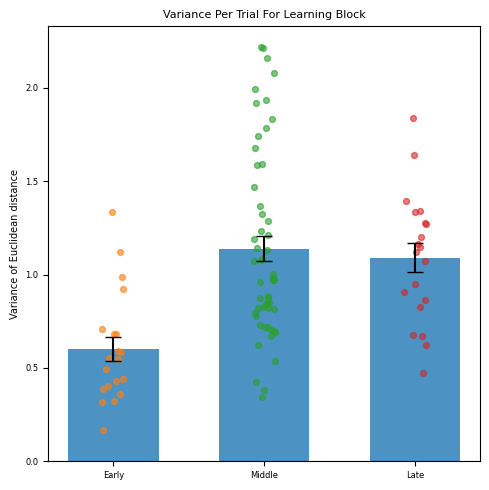

In [ ]:
def euclidian_dist_var(E_euc_dist_list):
    var_list = []
    for i in range(len(E_euc_dist_list)):
        dist= E_euc_dist_list[i]
        var = np.var(dist)
        var_list.append(var)

    return var_list

var_listE = euclidian_dist_var(E_euc_dist_list)
var_listM = euclidian_dist_var(M_euc_dist_list)
var_listL = euclidian_dist_var(L_euc_dist_list)

varE = np.array(var_listE)
varM = np.array(var_listM)
varL = np.array(var_listL)

means = [varE.mean(), varM.mean(), varL.mean()]
sems  = [sem(varE), sem(varM), sem(varL)]

x = np.arange(3)
labels = ["Early", "Middle", "Late"]

fig, ax = plt.subplots(figsize=(5, 5))

# bars
ax.bar(x, means, yerr=sems, capsize=6, width=0.6, alpha=0.8)

rng = np.random.default_rng(0)
for i, vals in enumerate([varE, varM, varL]):
    jitter = (rng.random(len(vals)) - 0.5) * 0.15
    ax.scatter(np.full(len(vals), x[i]) + jitter, vals,
               s=18, alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel("Variance of Euclidean distance")
ax.set_title("Variance Per Trial For Learning Block")
ax.axhline(0, linewidth=0.8)

plt.tight_layout()
plt.show()


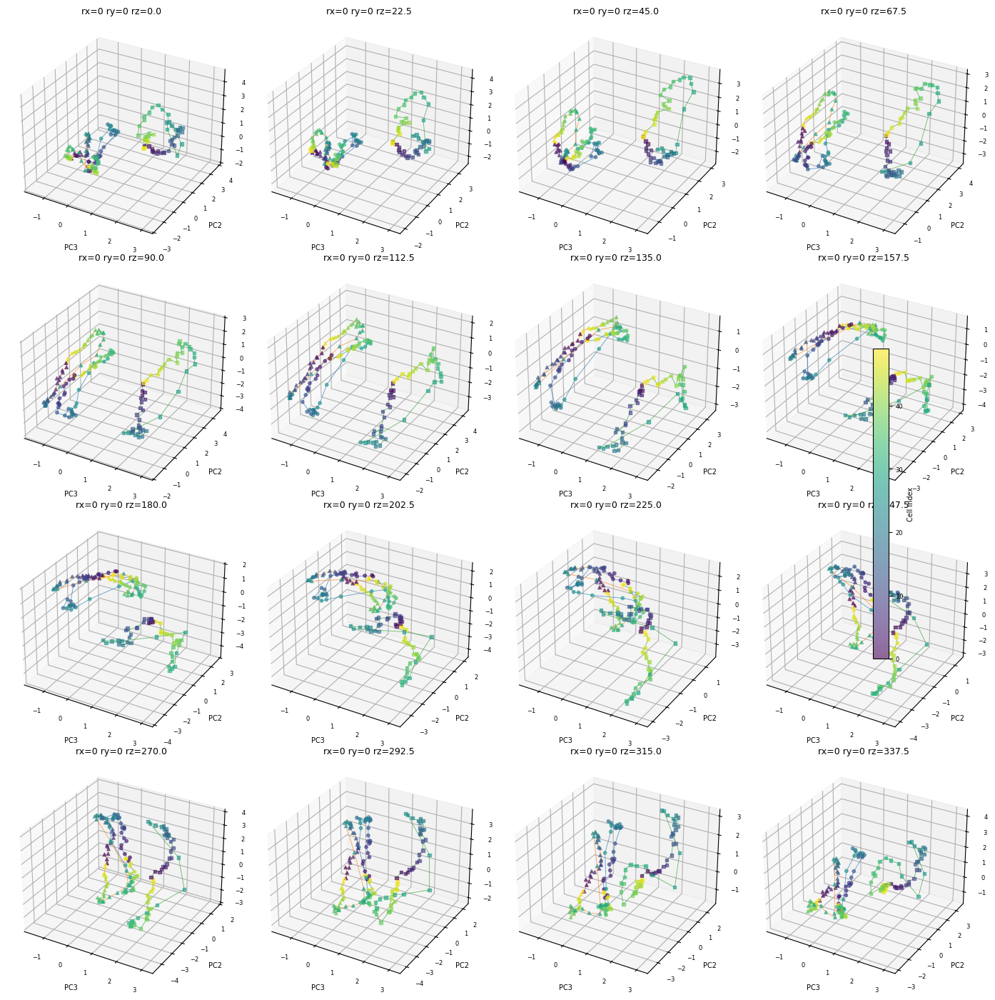

In [240]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def rotmat_xyz(rx_deg=0, ry_deg=0, rz_deg=0):
    rx, ry, rz = np.deg2rad([rx_deg, ry_deg, rz_deg])

    Rx = np.array([[1, 0, 0],
                   [0, np.cos(rx), -np.sin(rx)],
                   [0, np.sin(rx),  np.cos(rx)]])

    Ry = np.array([[ np.cos(ry), 0, np.sin(ry)],
                   [0, 1, 0],
                   [-np.sin(ry), 0, np.cos(ry)]])

    Rz = np.array([[np.cos(rz), -np.sin(rz), 0],
                   [np.sin(rz),  np.cos(rz), 0],
                   [0, 0, 1]])

    return Rz @ Ry @ Rx

def pca_means_one_celltype(model_type_array, n_early=20, late_start=74):
    transposed = model_type_array.transpose(0, 2, 1)   # (trial, cell, pos)
    n_trials, n_cells, n_pos = transposed.shape

    X = transposed.reshape(n_trials * n_cells, n_pos)
    pca = PCA(n_components=3).fit(X)
    Z = pca.transform(X).reshape(n_trials, n_cells, 3) # (trial, cell, PC)

    E_traj, M_traj, L_traj = [], [], []
    for t in range(n_trials):
        traj = Z[t]  # (cells, 3)
        if t < n_early:
            E_traj.append(traj)
        elif t >= late_start:
            L_traj.append(traj)
        else:
            M_traj.append(traj)

    mean_E = np.mean(np.asarray(E_traj), axis=0)  # (cells, 3)
    mean_M = np.mean(np.asarray(M_traj), axis=0)
    mean_L = np.mean(np.asarray(L_traj), axis=0)

    return mean_E, mean_M, mean_L, n_cells

def plot_16_rotations(model_type_array, rx=0, ry=0, n_early=20, late_start=74):
    mean_E, mean_M, mean_L, n_cells = pca_means_one_celltype(
        model_type_array, n_early=n_early, late_start=late_start
    )

    cvals = np.arange(n_cells)
    order = np.argsort(cvals)

    # 16 rotations around z by default
    rz_list = np.linspace(0, 337.5, 16)  # 0, 22.5, ..., 337.5

    fig = plt.figure(figsize=(14, 14))
    for i, rz in enumerate(rz_list, start=1):
        ax = fig.add_subplot(4, 4, i, projection="3d")

        R = rotmat_xyz(rx, ry, rz)
        E = mean_E @ R.T
        M = mean_M @ R.T
        L = mean_L @ R.T

        # NOTE: keeping your axis convention: x=PC3, y=PC2, z=PC1
        sc = ax.scatter(E[:,2], E[:,1], E[:,0], c=cvals, cmap="viridis", s=10, alpha=0.6, marker="o")
        ax.scatter(M[:,2], M[:,1], M[:,0], c=cvals, cmap="viridis", s=10, alpha=0.6, marker="^")
        ax.scatter(L[:,2], L[:,1], L[:,0], c=cvals, cmap="viridis", s=10, alpha=0.6, marker="s")

        ax.plot(E[order,2], E[order,1], E[order,0], alpha=0.7, lw=0.6)
        ax.plot(M[order,2], M[order,1], M[order,0], alpha=0.7, lw=0.6)
        ax.plot(L[order,2], L[order,1], L[order,0], alpha=0.7, lw=0.6)

        ax.set_title(f"rx={rx} ry={ry} rz={rz:.1f}", fontsize=9)
        ax.set_xlabel("PC3"); ax.set_ylabel("PC2"); ax.set_zlabel("PC1")

    # one shared colorbar
    fig.colorbar(sc, ax=fig.axes, fraction=0.02, pad=0.02).set_label("Cell index")
    plt.tight_layout()
    plt.show()

# usage:
plot_16_rotations(model_type_0_array, rx=0, ry=0)
# plot_16_rotations(model_type_1_array, rx=0, ry=0)


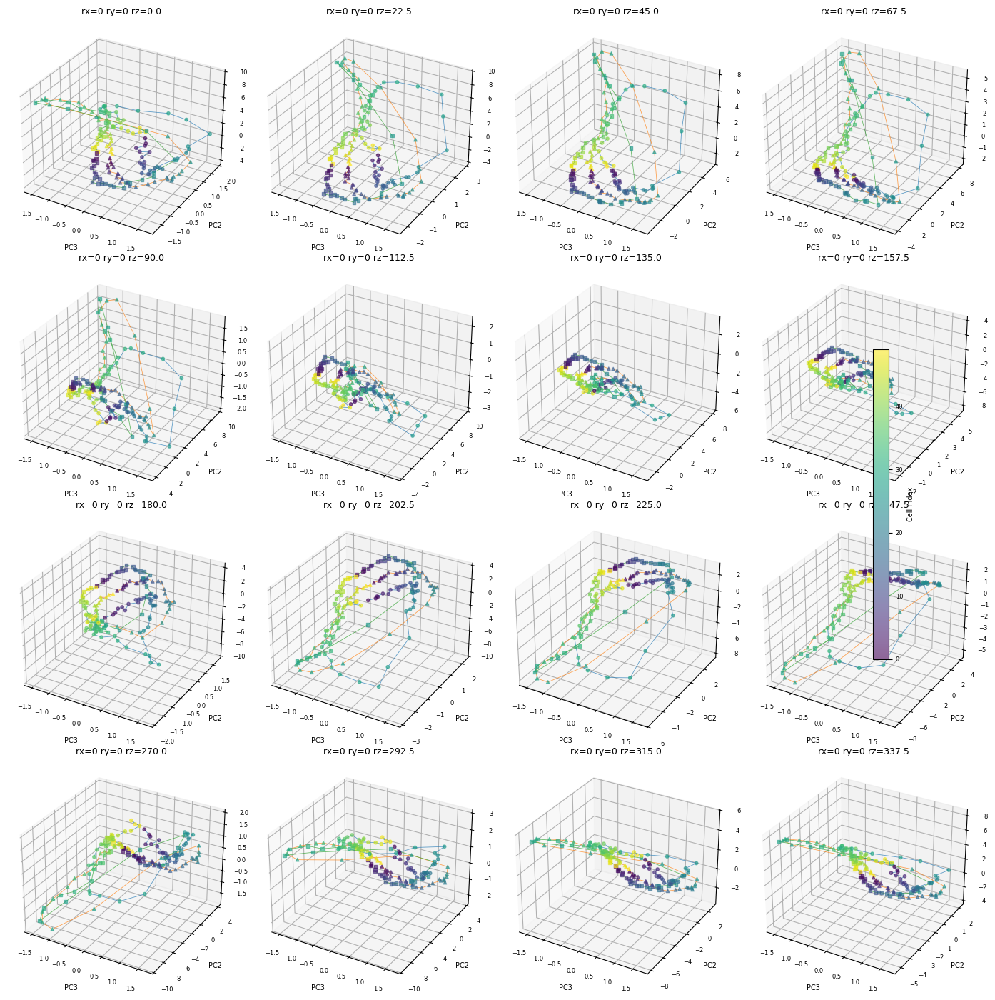

In [241]:
plot_16_rotations(model_type_1_array, rx=0, ry=0)

In [242]:
model_type_1_array.shape

(94, 73, 50)

In [144]:
with open('/Users/michaelfinch/CA1-interneuron-GLM/datasets/NDNF_fixed_model_dict_clean.pkl', 'rb') as f:
    NDNF_model_dict_clean  = pickle.load(f)

import ruptures as rpt

breakpoints_list = []

cp_list = []

truncated_cp_dict = {}
for animal in NDNF_model_dict_clean:
    cell_dict = {}
    for cell in NDNF_model_dict_clean[animal]:
        model = NDNF_model_dict_clean[animal][cell]
        w1 = model.vectors[0][0]
        w1_array = w1[:,:94].numpy(force=True).T
        model = rpt.Dynp(model="l2").fit(w1_array)
        breakpoints = model.predict(n_bkps=2)
        cell_dict[cell] = breakpoints[:-1]
        cp_list.append(breakpoints[:-1])

    truncated_cp_dict[animal] = cell_dict

    

In [143]:
early_data_list = []
middle_data_list = []
late_data_list = []

for animal in clean_resid_activity_dict_NDNF_newest:
    for cell in clean_resid_activity_dict_NDNF_newest[animal]:
        data = clean_resid_activity_dict_NDNF_newest[animal][cell][:,:94]
        early_cp=truncated_cp_dict[0]
        late_cp=truncated_cp_dict[1]
        
        early_data = clean_resid_activity_dict_NDNF_newest[animal][cell][:,:94]
        middle_data = clean_resid_activity_dict_NDNF_newest[animal][cell][:,:94]
        late_data = clean_resid_activity_dict_NDNF_newest[animal][cell][:,:94]

        early_data_list.append(np.mean(early_data, axis=1))
        middle_data_list.append(np.mean(middle_data, axis=1))
        late_data_list.append(np.mean(late_data, axis=1))


    
early_data_array = np.array(early_data_list)
early_data_array.shape


(174, 50)

In [84]:
def get_euclidian_dist_array(overall_data_array_0):
    overall_data_array_0_2d = overall_data_array_0.reshape(
        overall_data_array_0.shape[0] * overall_data_array_0.shape[1],
        overall_data_array_0.shape[2])
    pca = PCA(n_components=3).fit(overall_data_array_0_2d)
    pca_0 = pca.transform(overall_data_array_0_2d)

    pca_0_3d = pca_0.reshape(overall_data_array_0.shape[0],  # 94
                            overall_data_array_0.shape[1],  # 50
                            3)  

    euclid_dist_list = []
    for trial in range(pca_0_3d.shape[0]):
        data = pca_0_3d[trial,:,:]
        diffs = np.diff(data, axis=0)                  # (n_points-1, 3)
        euclid_dist = np.linalg.norm(diffs, axis=1)
        euclid_dist_list.append(euclid_dist)


    euclid_dist_array = np.array(euclid_dist_list)
    return euclid_dist_array

euclid_dist_array_0 = get_euclidian_dist_array(overall_data_array_0)
euclid_dist_array_1 = get_euclidian_dist_array(overall_data_array_1)


In [ ]:
lick_array = animal_lick_dict["animal_1"]["Licks"]
for trial in range(25):
    plt.plot(lick_array[:,trial])
    plt.show()

(14, 50, 94)

In [243]:
velocity_array.shape

(14, 50, 94)

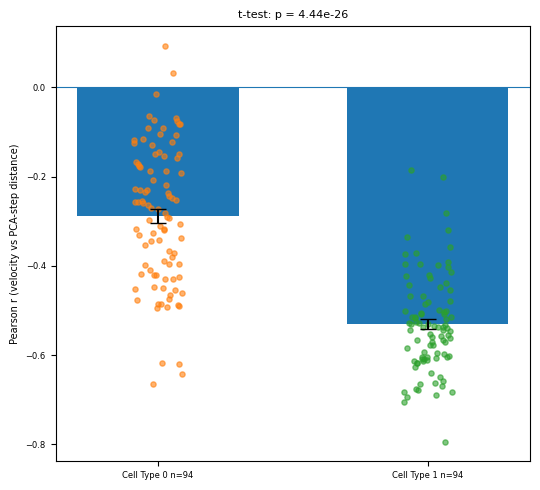

In [248]:
from scipy.stats import pearsonr, ttest_ind

clean_velocity_dict_NDNF_newest

def get_behav_list(clean_velocity_dict_NDNF_newest, behav="Velocity"):
    velocity_list = []

    for animal in clean_velocity_dict_NDNF_newest:
        velocity_list.append(clean_velocity_dict_NDNF_newest[animal][behav][:,:94])

    velocity_array = np.array(velocity_list)

    mean_velocity_array = np.mean(velocity_array, axis=0)

    return mean_velocity_array


def get_r_array(velocity_array, euclid_dist_array):
    r_list = []

    for trial in range(velocity_array.shape[1]):
        velocity_for_trial = velocity_array[:,trial]
        euclid_dist_array_trial = euclid_dist_array[trial,:]
        if not np.any(np.isnan(velocity_for_trial)) and np.std(velocity_for_trial[:-1])!=0 and np.std(euclid_dist_array_trial)!=0:
            r, _ = pearsonr(velocity_for_trial[:-1], euclid_dist_array_trial)
            r_list.append(r)

    r_array = np.array(r_list)
    return r_array

velocity_array = get_behav_list(clean_velocity_dict_NDNF_newest, behav="Velocity")

r0 = get_r_array(velocity_array, euclid_dist_array_0)
r1 = get_r_array(velocity_array, euclid_dist_array_1)

_,Pval=ttest_ind(r0,r1)

means = [r0.mean(), r1.mean()]
sems = [r0.std(ddof=1) / np.sqrt(len(r0)), r1.std(ddof=1) / np.sqrt(len(r1))]

x = np.array([0, 1])

fig, ax = plt.subplots(figsize=(5.5, 5))

# Bars with SEM
ax.bar(x, means, yerr=sems, capsize=6, width=0.6)

# Scatter individual points with jitter
rng = np.random.default_rng(0)
jitter0 = (rng.random(len(r0)) - 0.5) * 0.18
jitter1 = (rng.random(len(r1)) - 0.5) * 0.18
ax.scatter(np.full(len(r0), x[0]) + jitter0, r0, s=14, alpha=0.6)
ax.scatter(np.full(len(r1), x[1]) + jitter1, r1, s=14, alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels([f"Cell Type 0 n={len(r0)}", f"Cell Type 1 n={len(r1)}"])
ax.set_ylabel("Pearson r (velocity vs PCA-step distance)")
ax.set_title(f"t-test: p = {Pval:.3g}")

ax.axhline(0, linewidth=0.8)
plt.tight_layout()
plt.show()

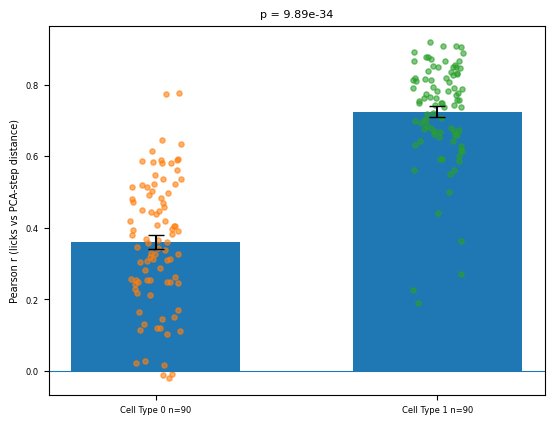

In [249]:
def plot_corr_euclidian(clean_lick_dict_NDNF_newest, behav=None, ax=None):

    licks_array = get_behav_list(clean_lick_dict_NDNF_newest, behav=behav)

    r0 = get_r_array(licks_array, euclid_dist_array_0)
    r1 = get_r_array(licks_array, euclid_dist_array_1)

    _,Pval=ttest_ind(r0,r1)

    means = [r0.mean(), r1.mean()]
    sems = [r0.std(ddof=1) / np.sqrt(len(r0)), r1.std(ddof=1) / np.sqrt(len(r1))]

    x = np.array([0, 1])

    ax.bar(x, means, yerr=sems, capsize=6, width=0.6)

    rng = np.random.default_rng(0)
    jitter0 = (rng.random(len(r0)) - 0.5) * 0.18
    jitter1 = (rng.random(len(r1)) - 0.5) * 0.18
    ax.scatter(np.full(len(r0), x[0]) + jitter0, r0, s=14, alpha=0.6)
    ax.scatter(np.full(len(r1), x[1]) + jitter1, r1, s=14, alpha=0.6)

    ax.set_xticks(x)
    ax.set_xticklabels([f"Cell Type 0 n={len(r0)}", f"Cell Type 1 n={len(r1)}"])
    ax.set_ylabel("Pearson r (licks vs PCA-step distance)")
    ax.set_title(f"p = {Pval:.3g}")

    ax.axhline(0, linewidth=0.8)

fig, ax = plt.subplots()
plot_corr_euclidian(clean_lick_dict_NDNF_newest, behav="Licks", ax=ax)




In [120]:
licks_array.shape

(42, 50, 94)

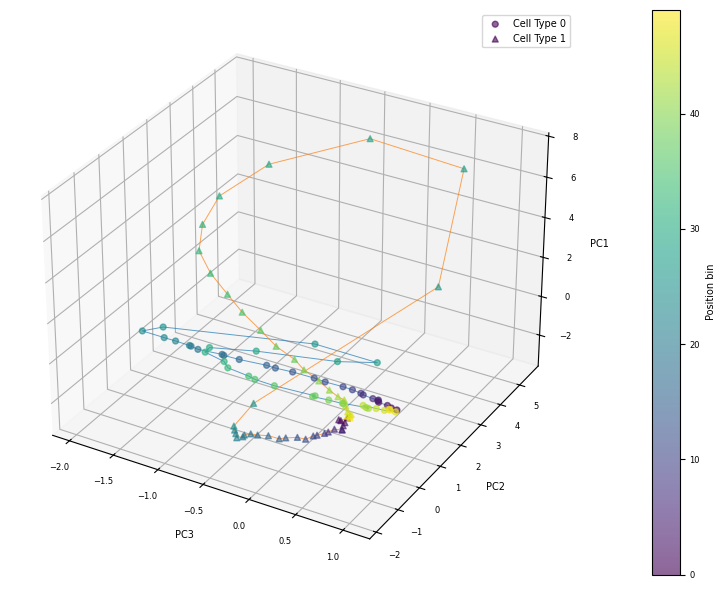

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_celltype_trajectories_shared_pca(overall_data_array, cell_type_0, cell_type_1, pos, ax):
    # overall_data_array: (n_cells, n_pos)
    X_all = overall_data_array.T  # (n_pos, n_cells)  <-- samples=pos, features=cells

    pca = PCA(n_components=3).fit(X_all)

    # baseline = mean so centered contribution = 0 for cells we "turn off"
    X_base = np.tile(pca.mean_, (X_all.shape[0], 1))  # (n_pos, n_cells)

    X0 = X_base.copy()
    X0[:, cell_type_0] = X_all[:, cell_type_0]

    X1 = X_base.copy()
    X1[:, cell_type_1] = X_all[:, cell_type_1]

    Z0 = pca.transform(X0)
    Z1 = pca.transform(X1)

    order = np.argsort(pos)

    sc = ax.scatter(Z0[:,2], Z0[:,1], Z0[:,0], c=pos, cmap="viridis",
                    s=18, alpha=0.6, marker="o", label="Cell Type 0")
    ax.scatter(Z1[:,2], Z1[:,1], Z1[:,0], c=pos, cmap="viridis",
               s=18, alpha=0.6, marker="^", label="Cell Type 1")

    ax.plot(Z0[order,2], Z0[order,1], Z0[order,0], alpha=0.7, lw=0.7, color='b')
    ax.plot(Z1[order,2], Z1[order,1], Z1[order,0], alpha=0.7, lw=0.7, color='b')

    ax.set_xlabel("PC3"); ax.set_ylabel("PC2"); ax.set_zlabel("PC1")
    ax.legend()
    return sc

fig, ax = plt.subplots(1, 1, figsize=(8, 6), subplot_kw={"projection":"3d"})
sc = plot_celltype_trajectories_shared_pca(overall_data_array, cell_type_0, cell_type_1, pos, ax)
fig.colorbar(sc, ax=ax, pad=0.1).set_label("Position bin")
plt.tight_layout()
plt.show()


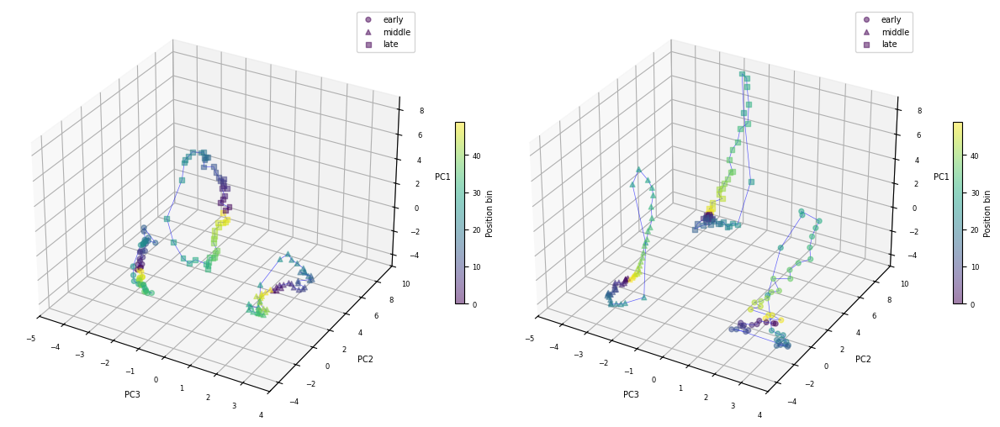

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def get_PCA_plot_single(X_all, X_early, X_middle, X_late, pos, ax):
    pca = PCA(n_components=3).fit(X_all)

    Z_early  = pca.transform(X_early)
    Z_middle = pca.transform(X_middle)
    Z_late   = pca.transform(X_late)

    order = np.argsort(pos)  # so lines follow position

    sc = ax.scatter(Z_early[:,2],  Z_early[:,1],  Z_early[:,0],
                    c=pos, cmap="viridis", s=18, alpha=0.5, marker="o", label="early")
    ax.scatter(Z_middle[:,2], Z_middle[:,1], Z_middle[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="^", label="middle")
    ax.scatter(Z_late[:,2],   Z_late[:,1],   Z_late[:,0],
               c=pos, cmap="viridis", s=18, alpha=0.5, marker="s", label="late")

    ax.plot(Z_early[order,2],  Z_early[order,1],  Z_early[order,0],  alpha=0.6, lw=0.5, color='b')
    ax.plot(Z_middle[order,2], Z_middle[order,1], Z_middle[order,0], alpha=0.6, lw=0.5, color='b')
    ax.plot(Z_late[order,2],   Z_late[order,1],   Z_late[order,0],   alpha=0.6, lw=0.5, color='b')

    ax.set_xlabel("PC3"); ax.set_ylabel("PC2"); ax.set_zlabel("PC1")
    ax.set_xlim(-5,4); ax.set_ylim(-5,10); ax.set_zlim(-5,9)
    ax.legend()
    return sc  # return mappable for colorbar

# --- build X_all for each dataset ---
X_all_0 = np.vstack([early_data_array_0, middle_data_array_0, late_data_array_0])
X_all_1 = np.vstack([early_data_array_1, middle_data_array_1, late_data_array_1])

# --- make 1x2 3D axes correctly ---
fig, axs = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={"projection": "3d"})

sc0 = get_PCA_plot(X_all_0, early_data_array_0, middle_data_array_0, late_data_array_0, pos, axs[0])
sc1 = get_PCA_plot(X_all_1, early_data_array_1, middle_data_array_1, late_data_array_1, pos, axs[1])

# one shared colorbar (or do separate if you prefer)
cbar = fig.colorbar(sc1, ax=axs[1], pad=0.08, fraction=0.02)
cbar.set_label("Position bin")

cbar = fig.colorbar(sc0, ax=axs[0], pad=0.08, fraction=0.02)
cbar.set_label("Position bin")

plt.tight_layout()
plt.show()


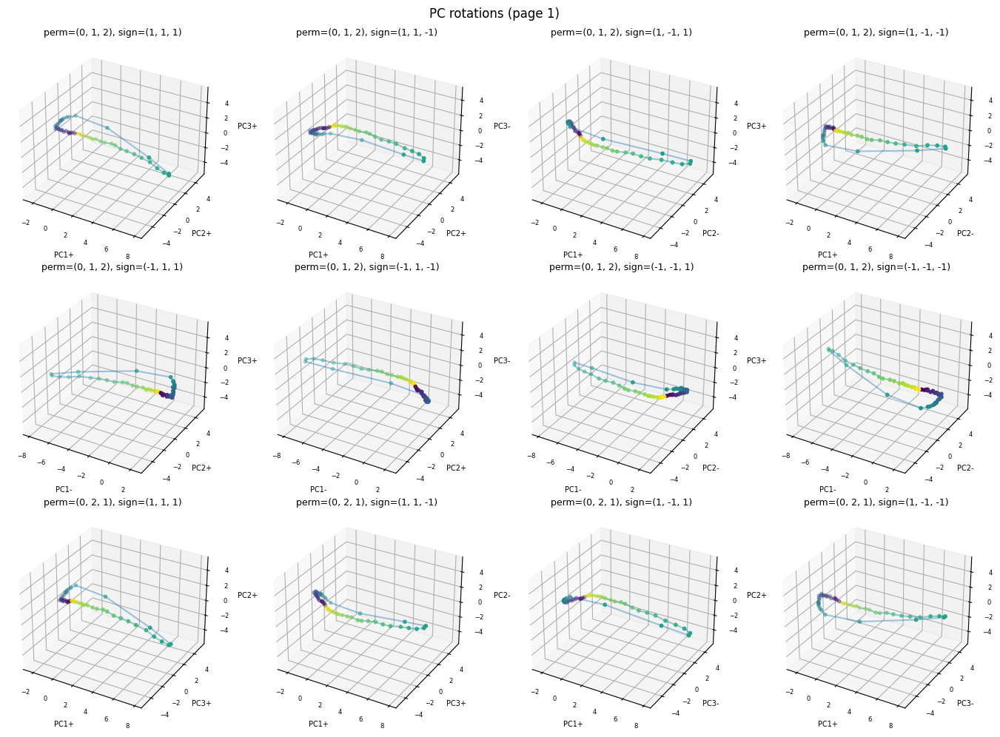

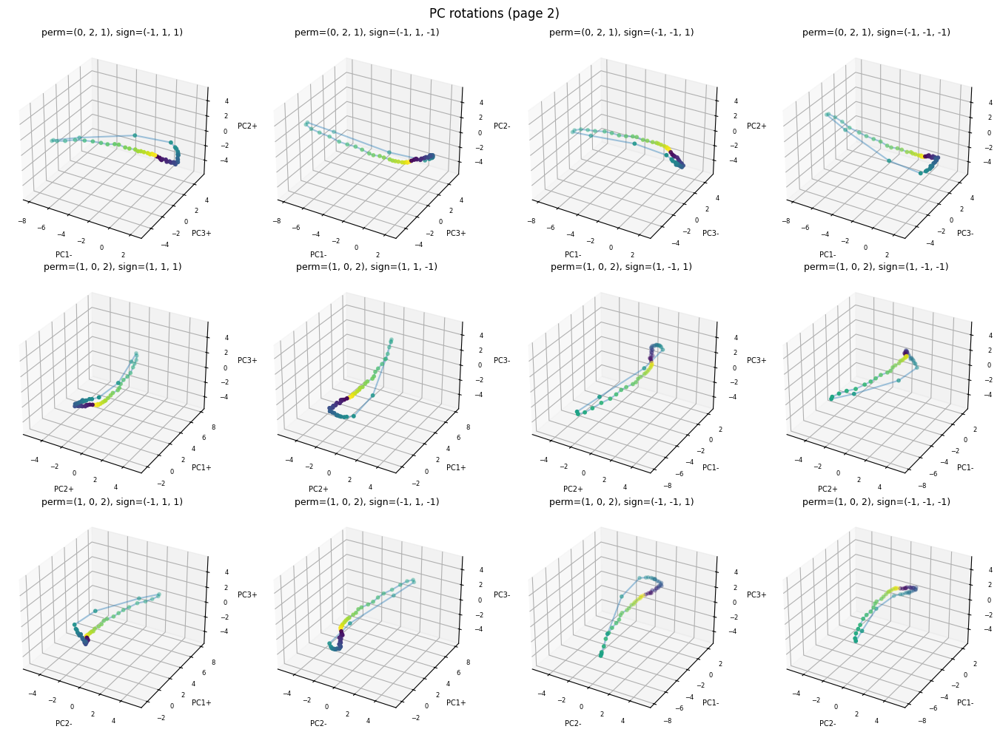

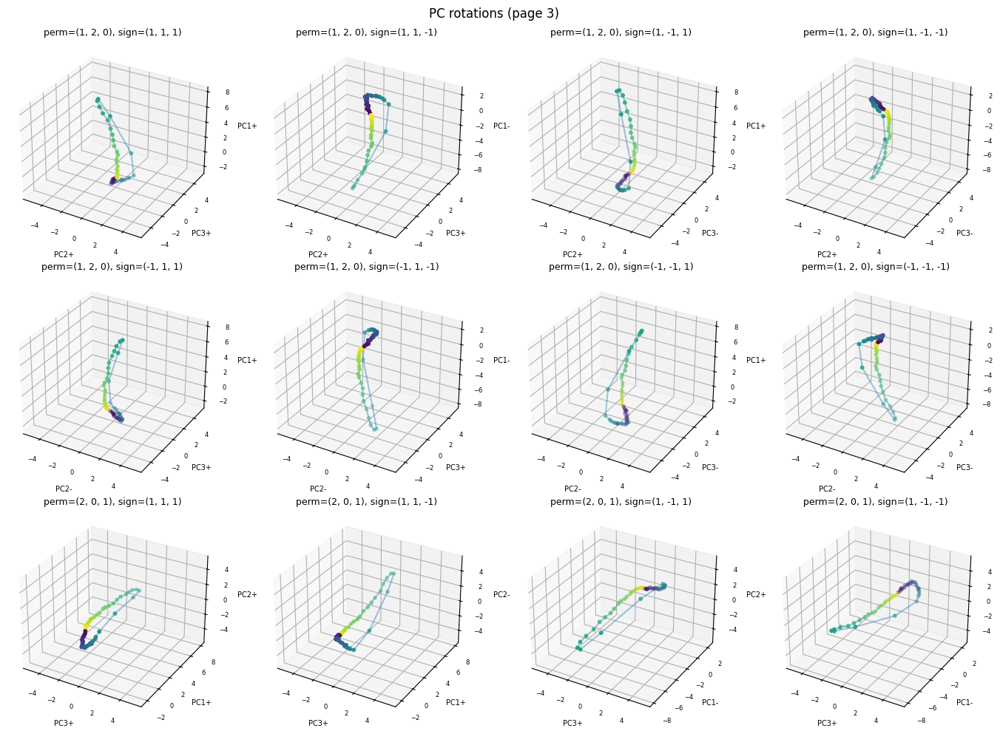

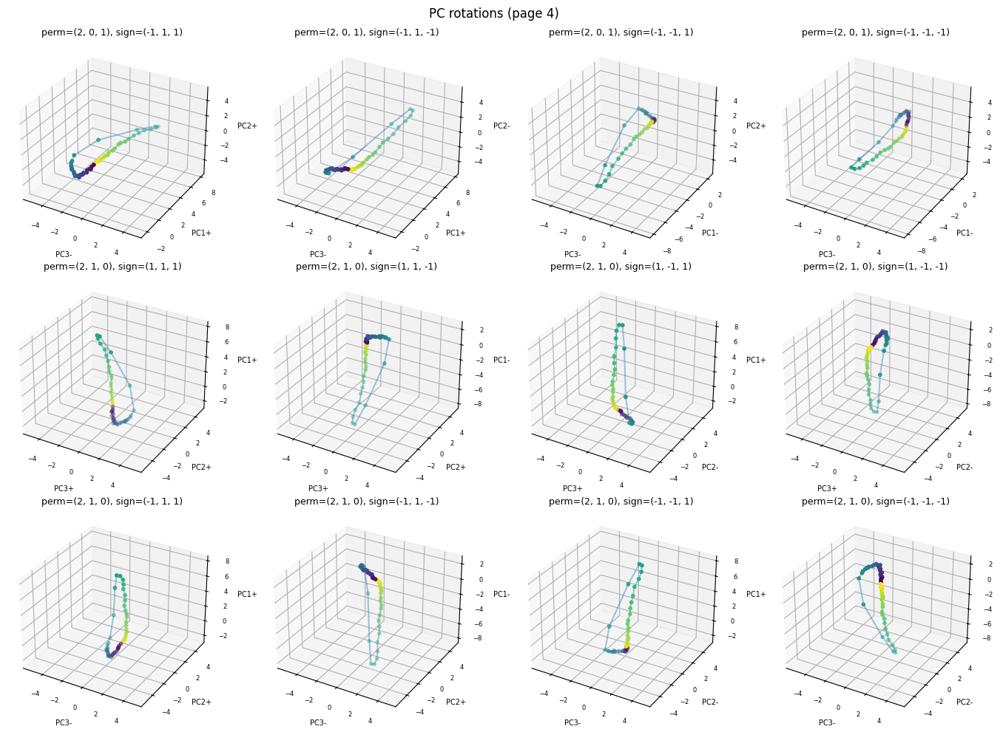

In [121]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# --- your existing stuff ---
Z3 = PCA(n_components=3).fit_transform(X1n)
Z3_tp = Z3.reshape(n_trials, n_pos, 3)
mean3 = Z3_tp.mean(axis=0)   # (pos, 3)

# pos should be length n_pos (colors)
# pos = np.arange(n_pos)  # if you don't already have it

# --- generate all rotations = permutations + sign flips ---
perms = list(itertools.permutations([0, 1, 2], 3))         # 6
signs = list(itertools.product([1, -1], repeat=3))         # 8

def apply_perm_sign(arr, perm, sgn):
    # arr: (pos, 3)
    out = arr[:, perm] * np.array(sgn)[None, :]
    return out

# --- plot in pages of 12 (4x3) so it’s readable ---
plots_per_page = 12
total = len(perms) * len(signs)

k = 0
for page_start in range(0, total, plots_per_page):
    fig = plt.figure(figsize=(14, 10))
    for i in range(plots_per_page):
        if k >= total:
            break

        perm = perms[k // len(signs)]
        sgn  = signs[k %  len(signs)]

        m = apply_perm_sign(mean3, perm, sgn)

        ax = fig.add_subplot(3, 4, i+1, projection="3d")
        sc = ax.scatter(m[:, 0], m[:, 1], m[:, 2], c=pos, cmap="viridis", s=10)
        ax.plot(m[:, 0], m[:, 1], m[:, 2], alpha=0.4)

        ax.set_title(f"perm={perm}, sign={sgn}", fontsize=9)
        ax.set_xlabel(f"PC{perm[0]+1}{'+' if sgn[0]>0 else '-'}")
        ax.set_ylabel(f"PC{perm[1]+1}{'+' if sgn[1]>0 else '-'}")
        ax.set_zlabel(f"PC{perm[2]+1}{'+' if sgn[2]>0 else '-'}")

        # optional: make the aspect roughly equal so rotations are comparable
        # (matplotlib 3D is annoying; this is a decent hack)
        mins = m.min(axis=0); maxs = m.max(axis=0)
        ctr = (mins + maxs) / 2
        span = (maxs - mins).max()
        ax.set_xlim(ctr[0]-span/2, ctr[0]+span/2)
        ax.set_ylim(ctr[1]-span/2, ctr[1]+span/2)
        ax.set_zlim(ctr[2]-span/2, ctr[2]+span/2)

        k += 1

    # one colorbar per page
    cbar.set_label("Position bin")
    fig.suptitle(f"PC rotations (page {page_start//plots_per_page + 1})", y=0.98)
    plt.tight_layout()
    plt.show()


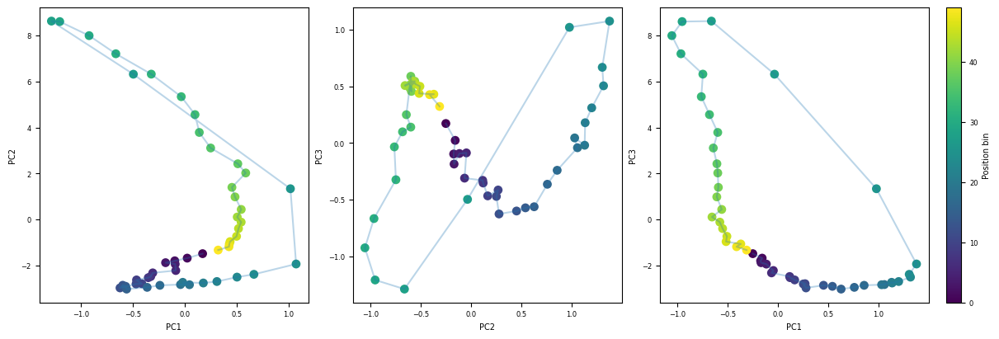

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# mean3: (n_pos, 3)  columns = [PC1, PC2, PC3]
pos = np.arange(mean3.shape[0])

pairs = [("PC1", "PC2", 0, 1),
         ("PC2", "PC3", 1, 2),
         ("PC1", "PC3", 0, 2)]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

for ax, (xl, yl, i, j) in zip(axs, pairs):
    sc = ax.scatter(mean3[:, j], mean3[:, i], c=pos, cmap="viridis", s=60, linewidths=0)
    ax.plot(mean3[:, j],mean3[:, i], alpha=0.3)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)

fig.colorbar(sc, ax=axs, fraction=0.02, pad=0.02, label="Position bin")
plt.show()


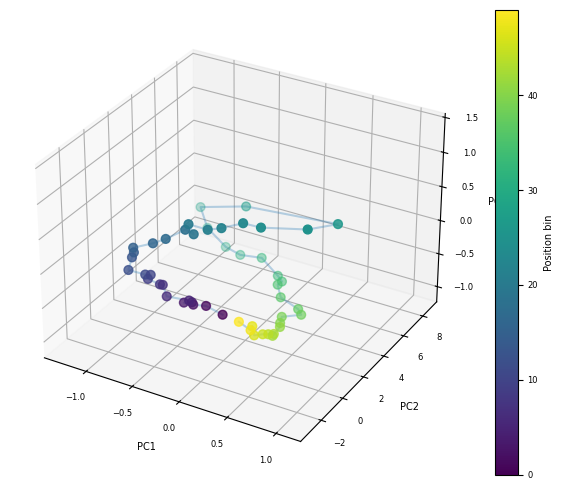

In [119]:
from sklearn.decomposition import PCA

Z3 = PCA(n_components=3).fit_transform(X1n)
Z3_tp = Z3.reshape(n_trials, n_pos, 3)
mean3 = Z3_tp.mean(axis=0)   # (pos, 3)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(mean3[:,1], mean3[:,0], mean3[:,2],
                c=pos, cmap='viridis', s=40)
ax.plot(mean3[:,1], mean3[:,0], mean3[:,2], alpha=0.3)
plt.colorbar(sc, label="Position bin")
ax.set_xlabel("PC1"); ax.set_ylabel("PC2"); ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()



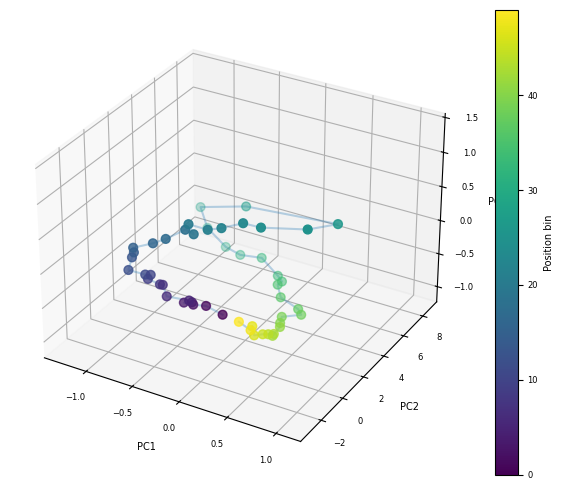

In [ ]:
from sklearn.decomposition import PCA

Z3 = PCA(n_components=3).fit_transform(X1n)
Z3_tp = Z3.reshape(n_trials, n_pos, 3)
mean3 = Z3_tp.mean(axis=0)   # (pos, 3)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(mean3[:,1], mean3[:,0], mean3[:,2],
                c=pos, cmap='viridis', s=40)
ax.plot(mean3[:,1], mean3[:,0], mean3[:,2], alpha=0.3)
plt.colorbar(sc, label="Position bin")
ax.set_xlabel("PC1"); ax.set_ylabel("PC2"); ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()



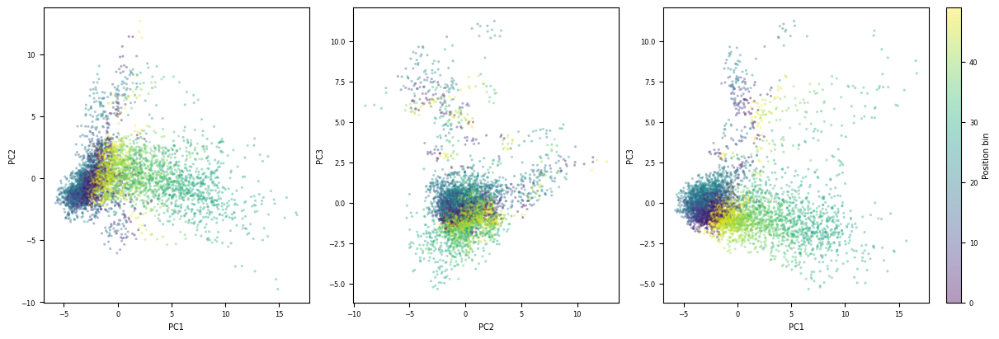

In [51]:
# Z3: (n_trials*n_pos, 3)
pos_idx = np.tile(np.arange(n_pos), n_trials)

pairs = [("PC1", "PC2", 0, 1),
         ("PC2", "PC3", 1, 2),
         ("PC1", "PC3", 0, 2)]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

for ax, (xl, yl, i, j) in zip(axs, pairs):
    sc = ax.scatter(Z3[:, i], Z3[:, j], c=pos_idx, cmap="viridis", s=5, alpha=0.4, linewidths=0)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)

fig.colorbar(sc, ax=axs, fraction=0.02, pad=0.02, label="Position bin")
plt.show()


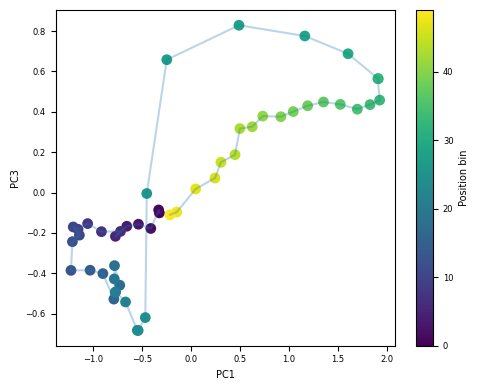

In [54]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

n_pos = 50
n_trials = 94

# X0n: (n_trials*n_pos, n_cells0)
X0n = X0.cpu().numpy() if hasattr(X0, "cpu") else X0

# fit PCA to 3D
Z0_3 = PCA(n_components=3).fit_transform(X0n)           # (n_trials*n_pos, 3)

# mean trajectory across trials
Z0_tp3 = Z0_3.reshape(n_trials, n_pos, 3)
mean0_3 = Z0_tp3.mean(axis=0)                           # (n_pos, 3)

# plot PC1 vs PC3 (or all pairs)
pos = np.arange(n_pos)

plt.figure(figsize=(5,4))
sc = plt.scatter(mean0_3[:,0], mean0_3[:,2], c=pos, cmap="viridis", s=60, linewidths=0)
plt.plot(mean0_3[:,0], mean0_3[:,2], alpha=0.3)
plt.xlabel("PC1")
plt.ylabel("PC3")
plt.colorbar(sc, label="Position bin")
plt.tight_layout()
plt.show()


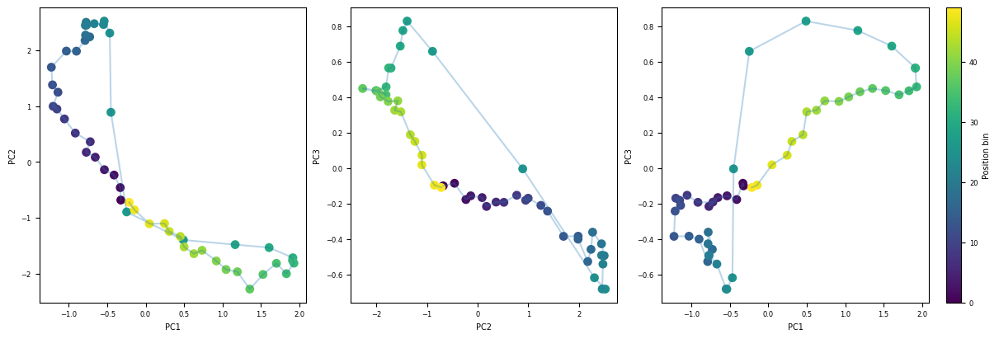

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

n_pos = 50
n_trials = 94

# X0n: (n_trials*n_pos, n_cells0)
X0n = X0.cpu().numpy() if hasattr(X0, "cpu") else X0

# 3D PCA on X0
Z0_3 = PCA(n_components=3).fit_transform(X0n)          # (n_trials*n_pos, 3)

# mean trajectory across trials: (pos, 3) = [PC1, PC2, PC3]
Z0_tp3 = Z0_3.reshape(n_trials, n_pos, 3)
mean0_3 = Z0_tp3.mean(axis=0)

pos = np.arange(n_pos)

pairs = [("PC1", "PC2", 0, 1),
         ("PC2", "PC3", 1, 2),
         ("PC1", "PC3", 0, 2)]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

for ax, (xl, yl, i, j) in zip(axs, pairs):
    sc = ax.scatter(mean0_3[:, i], mean0_3[:, j],
                    c=pos, cmap="viridis", s=60, linewidths=0)
    ax.plot(mean0_3[:, i], mean0_3[:, j], alpha=0.3)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)

fig.colorbar(sc, ax=axs, fraction=0.02, pad=0.02, label="Position bin")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def proj_line_and_ortho(X, w):
    """
    X: (n_pos, d) centered (recommended)
    w: (d,) unit vector
    returns: u (along w), v (along an orthogonal axis chosen from null space)
    """
    w = w / (np.linalg.norm(w) + 1e-12)
    u = X @ w

    # pick a stable orthogonal direction: subtract projection of e1 onto w, fallback to e2, etc.
    d = X.shape[1]
    vdir = None
    for k in range(d):
        e = np.zeros(d); e[k] = 1.0
        cand = e - (e @ w) * w
        if np.linalg.norm(cand) > 1e-6:
            vdir = cand / np.linalg.norm(cand)
            break
    v = X @ vdir
    return u, v

def regression_axis(mean_path):
    pos = np.arange(mean_path.shape[0])
    X = mean_path - mean_path.mean(0, keepdims=True)
    reg = LinearRegression().fit(X, pos)
    w = reg.coef_
    w = w / (np.linalg.norm(w) + 1e-12)
    u, v = proj_line_and_ortho(X, w)
    # flip so early bins are left
    if np.corrcoef(u, pos)[0,1] < 0:
        u *= -1
        w *= -1
    return u, v, w

def lda_axis(mean_path, labels):
    X = mean_path - mean_path.mean(0, keepdims=True)
    lda = LinearDiscriminantAnalysis(n_components=1)
    u = lda.fit_transform(X, labels).ravel()  # X = 50,3 for the 3 PCs and the labels is 50, where the middle 20 bins = 1 -- u becomes 50, in lDA space
    w = lda.coef_[0] # direction vector in PCA space 3,
    w = w / (np.linalg.norm(w) + 1e-12)
    _, v = proj_line_and_ortho(X, w) # project the data so that it lands on the LDA axis 
    if np.mean(u[labels==1]) < np.mean(u[labels==0]):     # flip so "middle" is to the right (optional aesthetic)
        u *= -1
        w *= -1
    return u, v, w

# Labels: middle 20 bins vs outer 30 bins (for n_pos=50)
n_pos = mean0_3.shape[0]
pos = np.arange(n_pos)
labels = np.zeros(n_pos, dtype=int)          # 0 = outer
labels[(pos >= 15) & (pos < 35)] = 1         # 1 = middle (20 bins)


In [59]:
from sklearn.decomposition import PCA

# X1n: (n_trials*n_pos, n_cells1)
X1n = X1.cpu().numpy() if hasattr(X1, "cpu") else X1

# 3D PCA on X1
Z1_3 = PCA(n_components=3).fit_transform(X1n)   # (n_trials*n_pos, 3)

# mean trajectory across trials
Z1_tp3 = Z1_3.reshape(n_trials, n_pos, 3)
mean1_3 = Z1_tp3.mean(axis=0)                   # (n_pos, 3)


In [113]:
import umap
# X1n: (n_trials*n_pos, n_cells1)
X1n = X1.cpu().numpy() if hasattr(X1, "cpu") else X1

# 3D PCA on X1
Z1_3 = umap(n_components=3).fit_transform(X1n)   # (n_trials*n_pos, 3)

# mean trajectory across trials
Z1_tp3 = Z1_3.reshape(n_trials, n_pos, 3)
mean1_3 = Z1_tp3.mean(axis=0)                   # (n_pos, 3)


TypeError: 'module' object is not callable

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


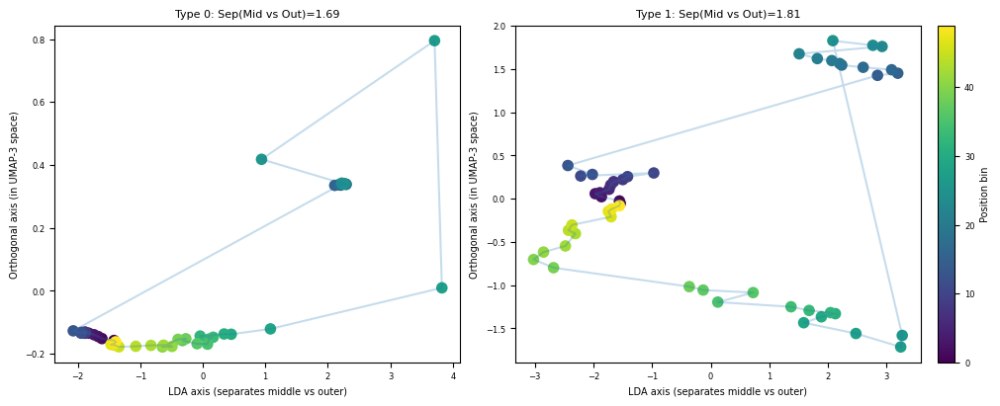

In [114]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler

# If you don't have this:
#   pip install umap-learn
import umap

def proj_line_and_ortho(X, w):
    w = np.asarray(w).ravel()
    w_unit = w / (np.linalg.norm(w) + 1e-12)
    u = X @ w_unit

    d = X.shape[1]
    vdir = None
    for k in range(d):
        e = np.zeros(d); e[k] = 1.0
        cand = e - (e @ w_unit) * w_unit
        if np.linalg.norm(cand) > 1e-6:
            vdir = cand / np.linalg.norm(cand)
            break
    if vdir is None:
        raise RuntimeError("Could not find orthogonal direction.")
    v = X @ vdir
    return u, v

def lda_axis(mean_path_3d, labels):
    # mean_path_3d: (n_pos, 3)
    X = mean_path_3d - mean_path_3d.mean(0, keepdims=True)

    lda = LinearDiscriminantAnalysis(n_components=1)
    u = lda.fit_transform(X, labels).ravel()     # (n_pos,)
    w = lda.coef_[0]                            # (3,)
    w = w / (np.linalg.norm(w) + 1e-12)

    # orthogonal coordinate for plotting
    _, v = proj_line_and_ortho(X, w)

    # flip so middle is positive (aesthetic / consistency)
    if u[labels == 1].mean() < u[labels == 0].mean():
        u *= -1
        w *= -1

    return u, v, w

def umap3_mean_path(X, n_trials, n_pos, *,
                   standardize_features=True,
                   baseline_subtract=True,
                   n_neighbors=30,
                   min_dist=0.05,
                   metric="cosine",
                   seed=0):
    """
    X: (n_trials*n_pos, n_cells)  (numpy or torch)
    Returns:
      mean_path_3: (n_pos, 3)
      Z3:          (n_trials*n_pos, 3) full embedding (after optional baseline subtract)
    """
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (X.cpu().numpy() if hasattr(X, "cpu") else np.asarray(X))
    N = n_trials * n_pos
    assert Xn.shape[0] == N, f"Expected {N} rows but got {Xn.shape[0]}"

    if standardize_features:
        Xn = StandardScaler(with_mean=True, with_std=True).fit_transform(Xn)

    reducer = umap.UMAP(
        n_components=3,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
        random_state=seed
    )
    Z3 = reducer.fit_transform(Xn)   # (N, 3)

    if baseline_subtract:
        Ztp = Z3.reshape(n_trials, n_pos, 3)
        Ztp = Ztp - Ztp[:, :1, :]     # subtract each trial's start point
        Z3 = Ztp.reshape(N, 3)

    mean_path_3 = Z3.reshape(n_trials, n_pos, 3).mean(axis=0)  # (n_pos, 3)
    return mean_path_3, Z3

# ---------------------------
# Usage (Type 0 and Type 1)
# ---------------------------
n_trials = 94
n_pos = 50
pos = np.arange(n_pos)

# labels for mean trajectory bins (length n_pos)
labels = np.zeros(n_pos, dtype=int)
labels[(pos >= 15) & (pos < 35)] = 1   # middle bins = 1

mean0_3_umap, Z0_3_umap = umap3_mean_path(X0, n_trials, n_pos, seed=0)
mean1_3_umap, Z1_3_umap = umap3_mean_path(X1, n_trials, n_pos, seed=0)

u0, v0, wlda0 = lda_axis(mean0_3_umap, labels)
u1, v1, wlda1 = lda_axis(mean1_3_umap, labels)

def lda_separation_strength(u, labels):
    m0 = u[labels == 0]
    m1 = u[labels == 1]
    return np.abs(m1.mean() - m0.mean()) / (u.std() + 1e-12)

sep_0 = lda_separation_strength(u0, labels)
sep_1 = lda_separation_strength(u1, labels)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

for ax, (u, v, title) in zip(
    axs,
    [(u0, v0, f"Type 0: Sep(Mid vs Out)={sep_0:.2f}"),
     (u1, v1, f"Type 1: Sep(Mid vs Out)={sep_1:.2f}")]
):
    sc = ax.scatter(u, v, c=pos, cmap="viridis", s=70, linewidths=0)
    ax.plot(u, v, alpha=0.25)
    ax.set_title(title)
    ax.set_xlabel("LDA axis (separates middle vs outer)")
    ax.set_ylabel("Orthogonal axis (in UMAP-3 space)")

fig.colorbar(sc, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


In [60]:
from sklearn.decomposition import PCA

# X0n: (n_trials*n_pos, n_cells0)
X0n = X0.cpu().numpy() if hasattr(X0, "cpu") else X0

# 3D PCA on X0
Z0_3 = PCA(n_components=3).fit_transform(X0n)   # (n_trials*n_pos, 3)

# mean trajectory across trials
Z0_tp3 = Z0_3.reshape(n_trials, n_pos, 3)
mean0_3 = Z0_tp3.mean(axis=0)                   # (n_pos, 3)


In [ ]:
import umap
# X0n: (n_trials*n_pos, n_cells0)
X0n = X0.cpu().numpy() if hasattr(X0, "cpu") else X0

# 3D PCA on X0
Z0_3 = umap(n_components=3).fit_transform(X0n)   # (n_trials*n_pos, 3)

# mean trajectory across trials
Z0_tp3 = Z0_3.reshape(n_trials, n_pos, 3)
mean0_3 = Z0_tp3.mean(axis=0)                   # (n_pos, 3)


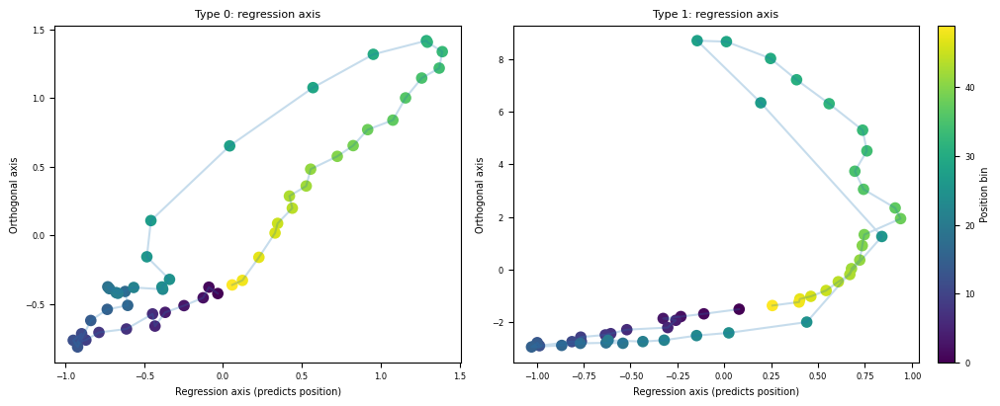

In [61]:
u0, v0, wreg0 = regression_axis(mean0_3)
u1, v1, wreg1 = regression_axis(mean1_3)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

for ax, (u, v, title) in zip(
    axs,
    [(u0, v0, "Type 0: regression axis"),
     (u1, v1, "Type 1: regression axis")]
):
    sc = ax.scatter(u, v, c=pos, cmap="viridis", s=70, linewidths=0)
    ax.plot(u, v, alpha=0.25)
    ax.set_title(title)
    ax.set_xlabel("Regression axis (predicts position)")
    ax.set_ylabel("Orthogonal axis")

fig.colorbar(sc, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


In [105]:
mean0_3.shape

(50, 3)

[-3.1299548  -2.4559293  -2.477855   -2.3957055  -2.0959132  -2.3700776
 -1.6050922  -1.6266348  -1.0444192  -0.919159   -0.83775586 -0.20131159
 -0.16175973 -0.03803885  1.2141032   1.4242835   1.5732243   2.2360158
  2.689991    2.839865    2.6746836   2.552003    2.6056497   2.1320016
  2.3177295   2.2108173   1.4150099   0.28291154  1.4354806   2.4728806
  2.8916748   2.4646208   2.3275971   1.6952672   0.83600783  0.9414685
  0.11080766 -0.9474883  -0.55099106 -0.92154574 -0.91389203 -0.7927897
 -1.4714577  -1.4676698  -1.7153044  -1.9849045  -2.1265883  -2.8590837
 -3.1892886  -3.0434916 ]
[-2.0450459  -1.7943614  -1.9027579  -1.9214816  -1.7916778  -1.7308346
 -1.8128891  -1.2437301  -1.2561873  -1.1252894  -0.86737084 -0.92516774
 -0.9068847  -0.17816031  0.11304271  0.3506844   0.8445401   1.2410039
  1.9687743   1.8370454   2.3004546   2.246718    2.5021024   3.027286
  3.0229855   3.5065646   4.353077    4.497478    3.9965408   2.8661337
  1.9731278   1.6824841   1.7791893  

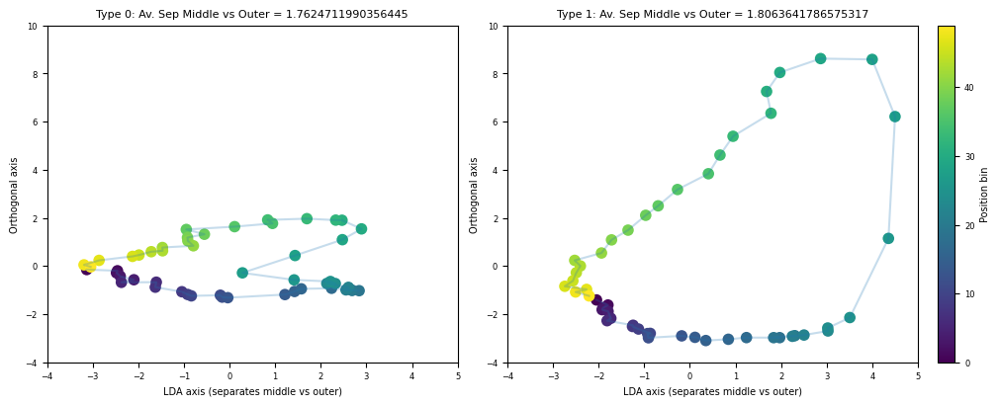

In [95]:
u0, v0, wlda0 = lda_axis(mean0_3, labels)
u1, v1, wlda1 = lda_axis(mean1_3, labels)


def lda_separation_strength(u, labels):
    m0 = u[labels == 0]
    m1 = u[labels == 1]
    return np.abs(np.mean(m1) - np.mean(m0)) / np.std(u)

sep_0 = lda_separation_strength(u0, labels)
sep_1 = lda_separation_strength(u1, labels)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

for ax, (u, v, title) in zip(
    axs,
    [(u0, v0, f"Type 0: Av. Sep Middle vs Outer = {sep_0}"),
     (u1, v1, f"Type 1: Av. Sep Middle vs Outer = {sep_1}")]
):
    
    print(u)
    sc = ax.scatter(u, v, c=pos, cmap="viridis", s=70, linewidths=0)
    ax.plot(u, v, alpha=0.25)
    ax.set_title(title)
    ax.set_xlabel("LDA axis (separates middle vs outer)")
    ax.set_ylabel("Orthogonal axis")
    ax.set_ylim(-4, 10)
    ax.set_xlim(-4, 5)


fig.colorbar(sc, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


Type0 mean step: 0.4478351761655636 max step: 1.3589851067993162
Type1 mean step: 0.6625715891337541 max step: 5.0643799228948465


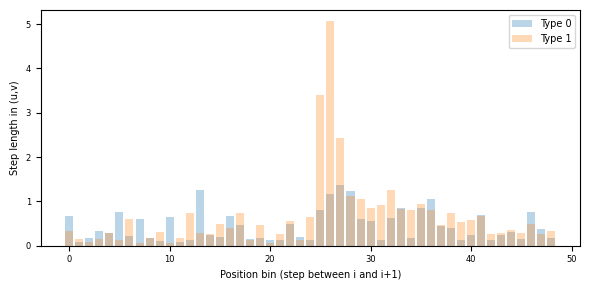

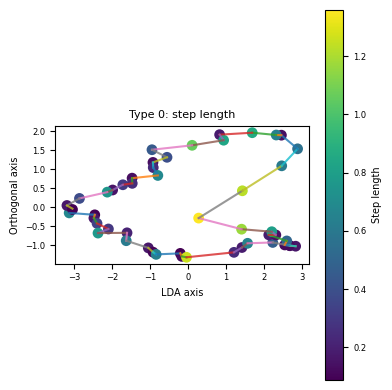

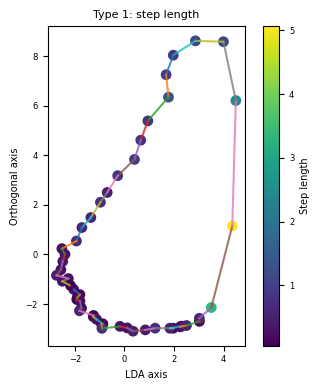

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def sequential_steps(u, v):
    u = np.asarray(u).ravel()
    v = np.asarray(v).ravel()
    du = np.diff(u)
    dv = np.diff(v)
    step = np.sqrt(du**2 + dv**2)      # Euclidean distance between successive points
    return du, dv, step

du0, dv0, step0 = sequential_steps(u0, v0)
du1, dv1, step1 = sequential_steps(u1, v1)

print("Type0 mean step:", step0.mean(), "max step:", step0.max())
print("Type1 mean step:", step1.mean(), "max step:", step1.max())


pos_edges = np.arange(len(step0))  # step i is between pos i and i+1

fig, ax = plt.subplots(figsize=(6,3))
ax.bar(pos_edges, step0, label="Type 0", alpha=0.3)
ax.bar(pos_edges, step1, label="Type 1", alpha=0.3)
ax.set_xlabel("Position bin (step between i and i+1)")
ax.set_ylabel("Step length in Euclidian Distance")
ax.legend()
plt.tight_layout()
plt.show()


In [68]:
def lda_separation_strength(u, labels):
    m0 = u[labels == 0]
    m1 = u[labels == 1]
    return np.abs(np.mean(m1) - np.mean(m0)) / np.std(u)

d0 = lda_separation_strength(u0, labels)
d1 = lda_separation_strength(u1, labels)
print(d0)
print(d1)

1.7624712
1.8063642


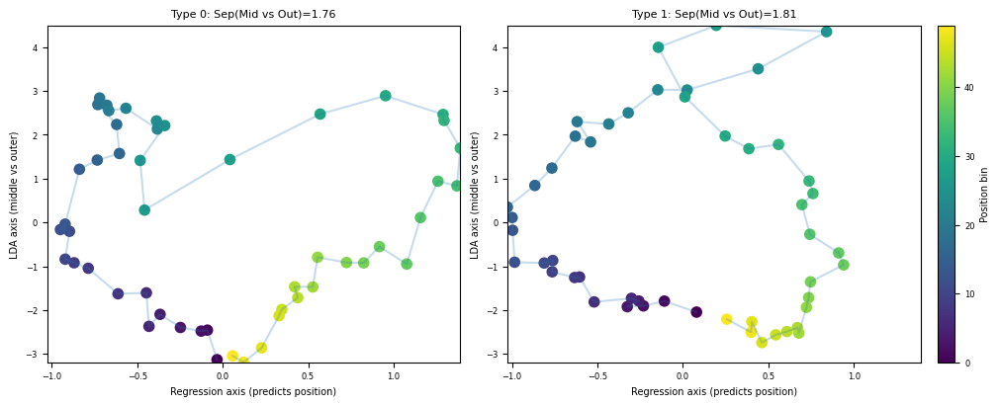

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def regression_u(mean_path):
    """
    mean_path: (n_pos, d) e.g. (50,3)
    returns u_reg: (n_pos,) projection along regression axis that predicts pos
    """
    pos = np.arange(mean_path.shape[0])
    X = mean_path - mean_path.mean(0, keepdims=True)

    reg = LinearRegression().fit(X, pos)
    w = reg.coef_
    w = w / (np.linalg.norm(w) + 1e-12)

    u = X @ w  # projection along regression axis

    # flip so early bins are left (increasing with pos)
    if np.corrcoef(u, pos)[0, 1] < 0:
        u *= -1
        w *= -1
    return u, w

# --- compute LDA projections (you already have these) ---
# u0, v0, wlda0 = lda_axis(mean0_3, labels)
# u1, v1, wlda1 = lda_axis(mean1_3, labels)

# --- compute regression projections (pos axis) ---
ureg0, wreg0 = regression_u(mean0_3)
ureg1, wreg1 = regression_u(mean1_3)

def lda_separation_strength(u, labels):
    m0 = u[labels == 0]
    m1 = u[labels == 1]
    return np.abs(np.mean(m1) - np.mean(m0)) / (np.std(u) + 1e-12)

sep_0 = lda_separation_strength(u0, labels)
sep_1 = lda_separation_strength(u1, labels)

pos = np.arange(mean0_3.shape[0])  # position bins for coloring

fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

for ax, (u_lda, u_reg, title) in zip(
    axs,
    [(u0, ureg0, f"Type 0: Sep(Mid vs Out)={sep_0:.2f}"),
     (u1, ureg1, f"Type 1: Sep(Mid vs Out)={sep_1:.2f}")]
):
    sc = ax.scatter(u_reg, u_lda, c=pos, cmap="viridis", s=70, linewidths=0)
    ax.plot(u_reg, u_lda, alpha=0.25)
    ax.set_title(title)
    ax.set_ylabel("LDA axis (middle vs outer)")
    ax.set_xlabel("Regression axis (predicts position)")

# optional: shared limits so magnitude differences are visible
ylim = (min(u0.min(), u1.min()), max(u0.max(), u1.max()))
xlim = (min(ureg0.min(), ureg1.min()), max(ureg0.max(), ureg1.max()))
for ax in axs:
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

fig.colorbar(sc, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


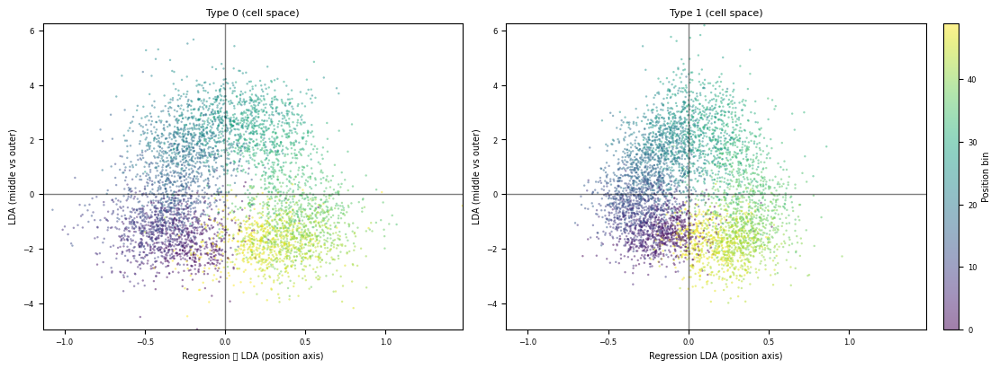

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

def reg_vs_lda_cellspace(X, n_trials, n_pos, mid_lo=15, mid_hi=35,
                        standardize=True, ridge_alpha=1.0):
    """
    X: (n_trials*n_pos, n_cells) handed in and NO PCA before projection onto LDA Axis -- in PCA version we reduce the 100 cells into 3 pcs and then project onto LDA -- here we reduce directly over the 
    Returns:
      x: (N,) projection onto regression axis 
      y: (N,) projection onto LDA axis
      pos_idx: (N,) position bins for coloring
      w_lda, w_reg_perp: (n_cells,) unit vectors
    """
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (X.cpu().numpy() if hasattr(X, "cpu") else X)
    N = n_trials * n_pos

    pos_idx = np.tile(np.arange(n_pos), n_trials).astype(int)

    # LDA labels: middle vs outer
    labels = np.zeros_like(pos_idx, dtype=int)
    labels[(pos_idx >= mid_lo) & (pos_idx < mid_hi)] = 1

    # center samples
    Xc = Xn - Xn.mean(axis=0, keepdims=True)

    # --- LDA axis ---
    lda = LinearDiscriminantAnalysis(n_components=1)
    y = lda.fit_transform(Xc, labels).ravel()
    w_lda = lda.coef_[0]
    w_lda /= (np.linalg.norm(w_lda) + 1e-12)

    # flip so middle tends positive
    if y[labels==1].mean() < y[labels==0].mean():
        y *= -1
        w_lda *= -1

    reg = Ridge(alpha=ridge_alpha)
    reg.fit(Xc, pos_idx.astype(float))
    w_reg = reg.coef_
    w_reg /= (np.linalg.norm(w_reg) + 1e-12)

    # --- Orthogonalize regression to LDA (Gram–Schmidt) ---
    # w_reg_perp = w_reg - (w_reg @ w_lda) * w_lda
    # w_reg_perp /= (np.linalg.norm(w_reg_perp) + 1e-12)

    # x = Xc @ w_reg_perp

    x = Xc @ w_reg

    # flip so x increases with position
    if np.corrcoef(x, pos_idx)[0, 1] < 0:
        x *= -1
        w_reg *= -1

    return x, y, pos_idx, w_lda, w_reg


# ---- run for both types ----
n_trials = 94
n_pos = 50

x0, y0, pos0, wlda0, wreg0p = reg_vs_lda_cellspace(X0, n_trials, n_pos, standardize=True, ridge_alpha=1.0)
x1, y1, pos1, wlda1, wreg1p = reg_vs_lda_cellspace(X1, n_trials, n_pos, standardize=True, ridge_alpha=1.0)

# ---- plot ----
fig, axs = plt.subplots(1, 2, figsize=(11, 4), constrained_layout=True)

sc0 = axs[0].scatter(x0, y0, c=pos0, cmap="viridis", s=3, alpha=0.5, linewidths=0)
axs[0].set_title("Type 0 (cell space)")
axs[0].set_xlabel("Regression ⟂ LDA (position axis)")
axs[0].set_ylabel("LDA (middle vs outer)")
axs[0].axhline(0, color="k", lw=1, alpha=0.5)
axs[0].axvline(0, color="k", lw=1, alpha=0.5)

sc1 = axs[1].scatter(x1, y1, c=pos1, cmap="viridis", s=3, alpha=0.5, linewidths=0)
axs[1].set_title("Type 1 (cell space)")
axs[1].set_xlabel("Regression LDA (position axis)")
axs[1].set_ylabel("LDA (middle vs outer)")
axs[1].axhline(0, color="k", lw=1, alpha=0.5)
axs[1].axvline(0, color="k", lw=1, alpha=0.5)

# shared limits (optional)
xlim = (min(x0.min(), x1.min()), max(x0.max(), x1.max()))
ylim = (min(y0.min(), y1.min()), max(y0.max(), y1.max()))
for ax in axs:
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

fig.colorbar(sc1, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


In [103]:
import numpy as np

def quadrant_stats(x, y, pos_idx=None, restrict=None, xthr=0.0, ythr=0.0):
    """
    restrict: None, or a boolean mask over samples (same length as x)
              e.g. restrict = (pos_idx>=15) & (pos_idx<35) to keep middle bins
    """
    x = np.asarray(x).ravel()
    y = np.asarray(y).ravel()
    N = len(x)

    if restrict is None:
        mask = np.ones(N, dtype=bool)
    else:
        mask = restrict.copy()

    xm = x[mask]; ym = y[mask]

    UL = np.sum((xm < xthr) & (ym > ythr))
    UR = np.sum((xm > xthr) & (ym > ythr))
    LL = np.sum((xm < xthr) & (ym < ythr))
    LR = np.sum((xm > xthr) & (ym < ythr))

    top = UL + UR
    bias = (UL - UR) / (top + 1e-12)   # [-1,1], + means more UL than UR
    frac_UL = UL / (top + 1e-12)
    frac_UR = UR / (top + 1e-12)

    return {
        "UL": int(UL), "UR": int(UR), "LL": int(LL), "LR": int(LR),
        "top_total": int(top),
        "frac_UL_given_top": float(frac_UL),
        "frac_UR_given_top": float(frac_UR),
        "bias_UL_minus_UR": float(bias)
    }

# example: restrict to middle bins
mid_mask0 = (pos0 >= 15) & (pos0 < 35)
mid_mask1 = (pos1 >= 15) & (pos1 < 35)

print("Type 0 (middle bins only):", quadrant_stats(x0, y0, pos0, restrict=mid_mask0))
print("Type 1 (middle bins only):", quadrant_stats(x1, y1, pos1, restrict=mid_mask1))


Type 0 (middle bins only): {'UL': 974, 'UR': 831, 'LL': 47, 'LR': 28, 'top_total': 1805, 'frac_UL_given_top': 0.5396121883656507, 'frac_UR_given_top': 0.4603878116343488, 'bias_UL_minus_UR': 0.0792243767313019}
Type 1 (middle bins only): {'UL': 1024, 'UR': 769, 'LL': 54, 'LR': 33, 'top_total': 1793, 'frac_UL_given_top': 0.5711098717233684, 'frac_UR_given_top': 0.42889012827663114, 'bias_UL_minus_UR': 0.14221974344673724}


In [93]:
def quick_stats(X, name):
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (X.cpu().numpy() if hasattr(X, "cpu") else X)
    mu = Xn.mean(axis=0)
    sd = Xn.std(axis=0, ddof=0)
    print(name)
    print("  mean(|mu|)   :", np.mean(np.abs(mu)))
    print("  mean(sd)     :", np.mean(sd))
    print("  median(sd)   :", np.median(sd))
    print("  min/max(sd)  :", sd.min(), sd.max())

quick_stats(X0, "X0")
quick_stats(X1, "X1")


X0
  mean(|mu|)   : 0.094911285
  mean(sd)     : 0.6677199
  median(sd)   : 0.6594921
  min/max(sd)  : 0.30661458 1.3061979
X1
  mean(|mu|)   : 0.08006741
  mean(sd)     : 0.79194206
  median(sd)   : 0.7692264
  min/max(sd)  : 0.4731638 1.4205102


In [92]:
print("Type0 std x,y:", np.std(x0), np.std(y0))
print("Type1 std x,y:", np.std(x1), np.std(y1))


Type0 std x,y: 0.7954115 1.9422406
Type1 std x,y: 0.66069585 2.103848


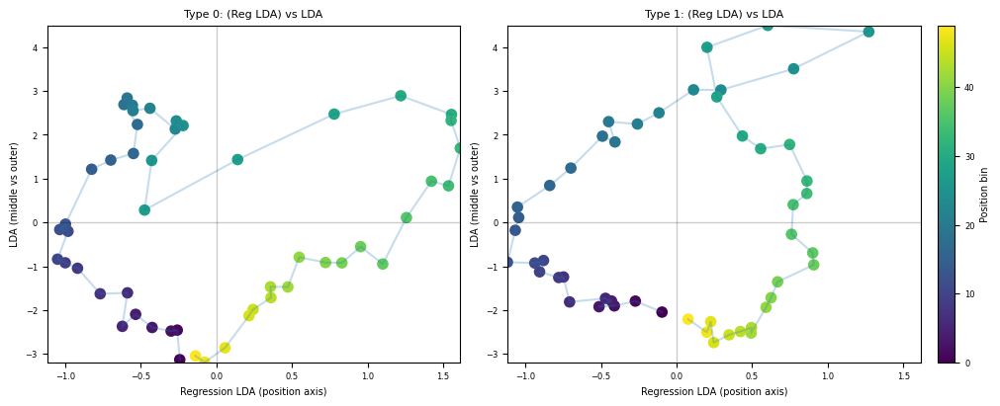

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LinearRegression

def fit_orth_reg_vs_lda(mean_path, mid_lo=15, mid_hi=35):
    """
    mean_path: (n_pos, d) e.g. (50,3)
    returns x (reg ⟂ lda), y (lda), and the unit vectors w_lda, w_reg_perp
    """
    n_pos = mean_path.shape[0]
    pos = np.arange(n_pos)

    X = mean_path - mean_path.mean(0, keepdims=True)

    # labels: middle vs outer
    labels = np.zeros(n_pos, dtype=int)
    labels[(pos >= mid_lo) & (pos < mid_hi)] = 1

    # LDA axis
    lda = LinearDiscriminantAnalysis(n_components=1)
    y = lda.fit_transform(X, labels).ravel()
    w_lda = lda.coef_[0]
    w_lda /= (np.linalg.norm(w_lda) + 1e-12)

    # flip so middle tends positive
    if y[labels==1].mean() < y[labels==0].mean():
        y *= -1
        w_lda *= -1

    # Regression axis (predict position)
    reg = LinearRegression().fit(X, pos)
    w_reg = reg.coef_
    w_reg /= (np.linalg.norm(w_reg) + 1e-12)

    # orthogonalize regression to LDA (Gram–Schmidt)
    w_reg_perp = w_reg - (w_reg @ w_lda) * w_lda
    w_reg_perp /= (np.linalg.norm(w_reg_perp) + 1e-12)

    x = X @ w_reg_perp

    # flip so x increases with position (optional aesthetic)
    if np.corrcoef(x, pos)[0,1] < 0:
        x *= -1
        w_reg_perp *= -1

    return x, y, labels, w_lda, w_reg_perp

# ---- Fit both types ----
x0, y0, labels0, wlda0, wreg0_perp = fit_orth_reg_vs_lda(mean0_3, mid_lo=15, mid_hi=35)
x1, y1, labels1, wlda1, wreg1_perp = fit_orth_reg_vs_lda(mean1_3, mid_lo=15, mid_hi=35)

pos = np.arange(mean0_3.shape[0])

fig, axs = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)

for ax, (x, y, title) in zip(
    axs,
    [(x0, y0, "Type 0: (Reg LDA) vs LDA"),
     (x1, y1, "Type 1: (Reg LDA) vs LDA")]
):
    sc = ax.scatter(x, y, c=pos, cmap="viridis", s=70, linewidths=0)
    ax.plot(x, y, alpha=0.25)
    ax.set_xlabel("Regression LDA (position axis)")
    ax.set_ylabel("LDA (middle vs outer)")
    ax.set_title(title)
    ax.axhline(0, color="k", lw=1, alpha=0.2)
    ax.axvline(0, color="k", lw=1, alpha=0.2)

# shared limits (optional)
xlim = (min(x0.min(), x1.min()), max(x0.max(), x1.max()))
ylim = (min(y0.min(), y1.min()), max(y0.max(), y1.max()))
for ax in axs:
    ax.set_xlim(xlim); ax.set_ylim(ylim)

fig.colorbar(sc, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


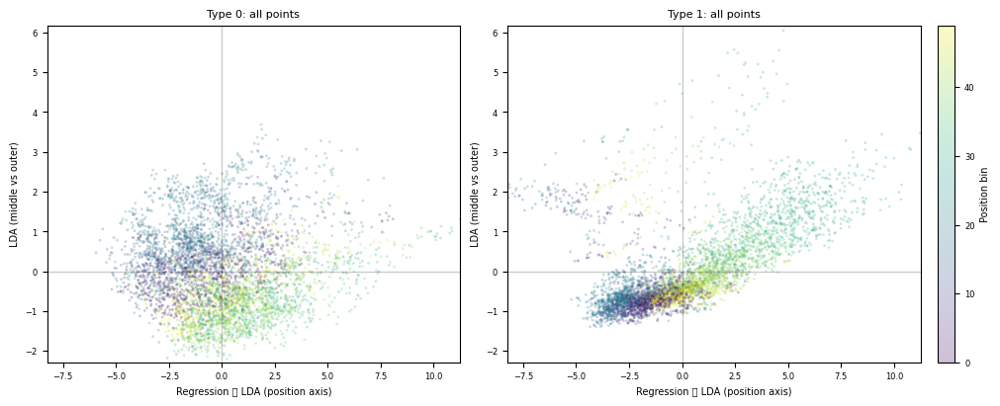

In [79]:
from sklearn.decomposition import PCA

def fit_orth_reg_vs_lda_allpoints(X, n_trials, n_pos, mid_lo=15, mid_hi=35):
    """
    X: (n_trials*n_pos, n_cells) for one type
    returns x,y for all points and pos_idx for coloring
    """
    N = n_trials * n_pos
    Xn = X.cpu().numpy() if hasattr(X, "cpu") else X
    assert Xn.shape[0] == N

    pos_idx = np.tile(np.arange(n_pos), n_trials).astype(int)

    # PCA to 3D to keep things stable (like before)
    Z3 = PCA(n_components=3, random_state=0).fit_transform(Xn)
    Zc = Z3 - Z3.mean(0, keepdims=True)

    # labels per point: middle vs outer
    labels = np.zeros_like(pos_idx, dtype=int)
    labels[(pos_idx >= mid_lo) & (pos_idx < mid_hi)] = 1

    # LDA axis
    lda = LinearDiscriminantAnalysis(n_components=1)
    y = lda.fit_transform(Zc, labels).ravel()
    w_lda = lda.coef_[0]
    w_lda /= (np.linalg.norm(w_lda) + 1e-12)
    if y[labels==1].mean() < y[labels==0].mean():
        y *= -1
        w_lda *= -1

    # Regression axis (predict position)
    reg = LinearRegression().fit(Zc, pos_idx.astype(float))
    w_reg = reg.coef_
    w_reg /= (np.linalg.norm(w_reg) + 1e-12)

    # orthogonalize regression to LDA
    w_reg_perp = w_reg - (w_reg @ w_lda) * w_lda
    w_reg_perp /= (np.linalg.norm(w_reg_perp) + 1e-12)

    x = Zc @ w_reg_perp
    if np.corrcoef(x, pos_idx)[0,1] < 0:
        x *= -1
        w_reg_perp *= -1

    return x, y, pos_idx

# ---- Type 0 and Type 1 ----
x0, y0, pos0 = fit_orth_reg_vs_lda_allpoints(X0, n_trials=94, n_pos=50, mid_lo=15, mid_hi=35)
x1, y1, pos1 = fit_orth_reg_vs_lda_allpoints(X1, n_trials=94, n_pos=50, mid_lo=15, mid_hi=35)

fig, axs = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)

sc0 = axs[0].scatter(x0, y0, c=pos0, cmap="viridis", s=4, alpha=0.25, linewidths=0)
axs[0].set_title("Type 0: all points")
axs[0].set_xlabel("Regression ⟂ LDA (position axis)")
axs[0].set_ylabel("LDA (middle vs outer)")
axs[0].axhline(0, color="k", lw=1, alpha=0.2)
axs[0].axvline(0, color="k", lw=1, alpha=0.2)

sc1 = axs[1].scatter(x1, y1, c=pos1, cmap="viridis", s=4, alpha=0.25, linewidths=0)
axs[1].set_title("Type 1: all points")
axs[1].set_xlabel("Regression ⟂ LDA (position axis)")
axs[1].set_ylabel("LDA (middle vs outer)")
axs[1].axhline(0, color="k", lw=1, alpha=0.2)
axs[1].axvline(0, color="k", lw=1, alpha=0.2)

# shared limits (optional)
xlim = (min(x0.min(), x1.min()), max(x0.max(), x1.max()))
ylim = (min(y0.min(), y1.min()), max(y0.max(), y1.max()))
for ax in axs:
    ax.set_xlim(xlim); ax.set_ylim(ylim)

fig.colorbar(sc1, ax=axs, fraction=0.03, pad=0.02, label="Position bin")
plt.show()


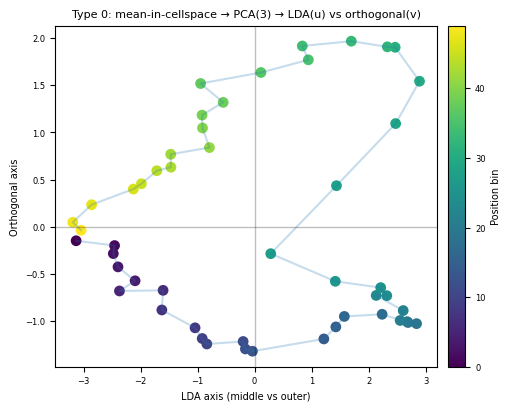

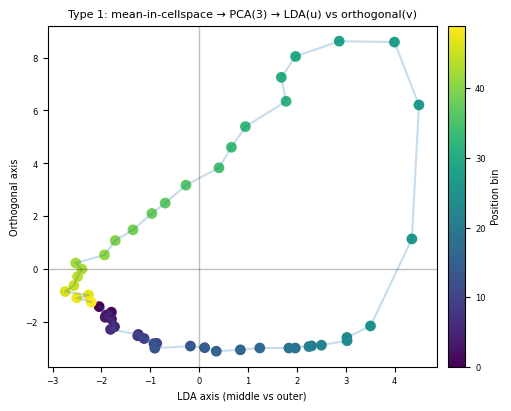

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def proj_line_and_ortho(X, w):
    """
    X: (n_pos, d) centered
    w: (d,) direction (need not be unit)
    returns:
      u = X @ w_unit          (n_pos,)
      v = X @ vdir_unit       (n_pos,) where vdir_unit ⟂ w_unit
      w_unit, vdir_unit       (d,)
    """
    w = np.asarray(w).ravel()
    w_unit = w / (np.linalg.norm(w) + 1e-12)
    u = X @ w_unit

    d = X.shape[1]
    vdir = None
    for k in range(d):
        e = np.zeros(d); e[k] = 1.0
        cand = e - (e @ w_unit) * w_unit
        if np.linalg.norm(cand) > 1e-6:
            vdir = cand / np.linalg.norm(cand)
            break
    if vdir is None:
        raise RuntimeError("Could not find orthogonal direction (unexpected).")
    v = X @ vdir
    return u, v, w_unit, vdir

def meantrials_pca_then_lda_plot(X, n_trials, n_pos, mid_lo=15, mid_hi=35, title="",
                              pca_fit_on="all_samples"):
    """
      1) PCA fit on all samples (trial*pos), keep 3 PCs
      2) Mean across trials in *feature space* -> (n_pos, n_features)
      3) Transform mean path -> (n_pos, 3)
      4) LDA on (n_pos, 3) to separate middle vs outer -> u (n_pos,)
      5) v = projection onto an orthogonal axis for visualization
      6) Plot u (x) vs v (y), colored by position bin
    """
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (X.cpu().numpy() if hasattr(X, "cpu") else np.asarray(X))
    N = n_trials * n_pos

    X_tp = Xn.reshape(n_trials, n_pos, -1)   # (trials, pos, features)
    Xmean = X_tp.mean(axis=0)               # (pos, features)

    # ---- PCA fit (usually on all samples for stable axes) ----
    pca = PCA(n_components=3)
    if pca_fit_on == "all_samples":
        pca.fit(Xn)
    elif pca_fit_on == "mean_path":
        pca.fit(Xmean)
    else:
        raise ValueError("pca_fit_on must be 'all_samples' or 'mean_path'")

    mean_3 = pca.transform(Xmean)           # (pos, 3)

    pos = np.arange(n_pos)
    labels = np.zeros(n_pos, dtype=int)
    labels[(pos >= mid_lo) & (pos < mid_hi)] = 1  # 1 = middle

    Zc = mean_3 - mean_3.mean(axis=0, keepdims=True)
    lda = LinearDiscriminantAnalysis(n_components=1)
    u = lda.fit_transform(Zc, labels).ravel()     # (pos,)
    w_lda = lda.coef_[0]                          # (3,) # projection axis

    # flip so middle tends positive
    if u[labels == 1].mean() < u[labels == 0].mean():
        u *= -1
        w_lda *= -1

    _, v, w_unit, v_unit = proj_line_and_ortho(Zc, w_lda)

    sc = ax.scatter(u, v, c=pos, cmap="viridis", s=60, linewidths=0)
    ax.plot(u, v, alpha=0.25)
    ax.set_xlabel("LDA axis (middle vs outer)")
    ax.set_ylabel("Orthogonal axis")
    ax.set_title(title)
    ax.axhline(0, color="k", lw=1, alpha=0.25)
    ax.axvline(0, color="k", lw=1, alpha=0.25)
    fig.colorbar(sc, ax=ax, fraction=0.05, pad=0.03, label="Position bin")
    plt.show()

    return mean_3, u, v, w_lda


# ------------------------------
# DROP-IN USAGE (for both types)
# ------------------------------
# Make sure X0, X1 are shaped (n_trials*n_pos, n_cells_type) in the SAME trial-major order
n_trials = 94
n_pos = 50

mean0_3, u0, v0, wlda0 = meantrials_pca_then_lda_plot(
    X0, n_trials, n_pos,
    mid_lo=15, mid_hi=35,
    title="Cell Type 0",
    pca_fit_on="all_samples")

mean1_3, u1, v1, wlda1 = meantrials_pca_then_lda_plot(
    X1, n_trials, n_pos,
    mid_lo=15, mid_hi=35,
    title="Cell Type 1",
    pca_fit_on="all_samples")


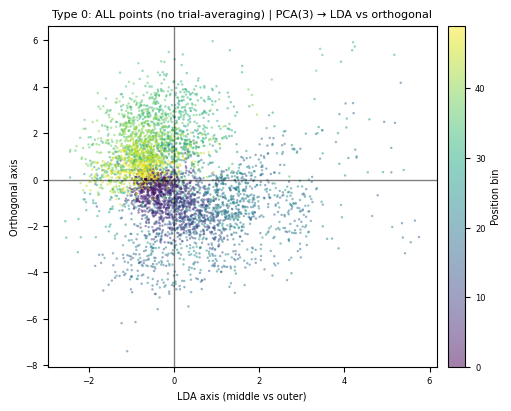

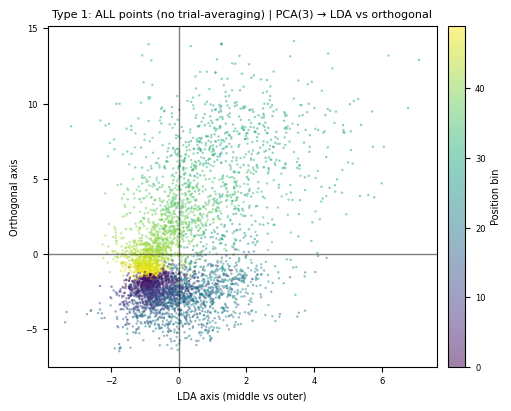

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def proj_line_and_ortho(X, w):
    w = np.asarray(w).ravel()
    w_unit = w / (np.linalg.norm(w) + 1e-12)
    u = X @ w_unit

    d = X.shape[1]
    vdir = None
    for k in range(d):
        e = np.zeros(d); e[k] = 1.0
        cand = e - (e @ w_unit) * w_unit
        if np.linalg.norm(cand) > 1e-6:
            vdir = cand / np.linalg.norm(cand)
            break
    if vdir is None:
        raise RuntimeError("Could not find orthogonal direction.")
    v = X @ vdir
    return u, v, w_unit, vdir

def pca3_then_lda_allpoints_plot(X, n_trials, n_pos, mid_lo=15, mid_hi=35,
                                baseline_subtract=True, title="", ax=None):
    """
      1) PCA fit on all samples -> Z3 (trials*pos,3)
      2) LDA on all samples using labels from pos_idx (middle 20 pos bins vs outer)
      4) u = projection onto LDA axis, v = projection onto an orthogonal axis
      5) scatter u vs v colored by position bin
    Returns u, v, pos_idx, w_lda, Z3
    """
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (X.cpu().numpy() if hasattr(X, "cpu") else np.asarray(X))
    N = n_trials * n_pos

    pos_idx   = np.tile(np.arange(n_pos), n_trials).astype(int)   # 0..49 repeated per trial
    trial_idx = np.repeat(np.arange(n_trials), n_pos).astype(int)

    pca = PCA(n_components=3)
    Z3 = pca.fit_transform(Xn)   # (trials*pos,3)

    if baseline_subtract:
        Ztp = Z3.reshape(n_trials, n_pos, 3)
        Ztp = Ztp - Ztp[:, :1, :]     
        Z3 = Ztp.reshape(N, 3)

    labels = np.zeros(N, dtype=int)
    labels[pos_idx >= mid_lo]=1
    labels[pos_idx < mid_hi]=1

    Zc = Z3 - Z3.mean(axis=0, keepdims=True)

    lda = LinearDiscriminantAnalysis(n_components=1)
    u = lda.fit_transform(Zc, labels).ravel()     # (trials*pos,)
    w_lda = lda.coef_[0]                          # (3,) # axis of the LDA to project onto 

    # flip so middle tends positive
    if u[labels == 1].mean() < u[labels == 0].mean():
        u *= -1
        w_lda *= -1

    _, v, _, _ = proj_line_and_ortho(Zc, w_lda)

    sc = ax.scatter(u, v, c=pos_idx, cmap="viridis", s=3, alpha=0.5, linewidths=0)
    ax.set_xlabel("LDA axis (middle vs outer)")
    ax.set_ylabel("Orthogonal axis")
    ax.set_title(title)
    ax.axhline(0, color="k", lw=1, alpha=0.5)
    ax.axvline(0, color="k", lw=1, alpha=0.5)
    fig.colorbar(sc, ax=ax, fraction=0.05, pad=0.03, label="Position bin")

    return u, v, pos_idx, w_lda, Z3



n_trials = 94
n_pos = 50

u0_all, v0_all, pos0_all, wlda0, Z0_3 = pca3_then_lda_allpoints_plot(
    X0, n_trials, n_pos,
    mid_lo=15, mid_hi=35,
    baseline_subtract=True,
    title="Cell Type 0"
)

u1_all, v1_all, pos1_all, wlda1, Z1_3 = pca3_then_lda_allpoints_plot(
    X1, n_trials, n_pos,
    mid_lo=15, mid_hi=35,
    baseline_subtract=True,
    title="Cell Type 1"
)


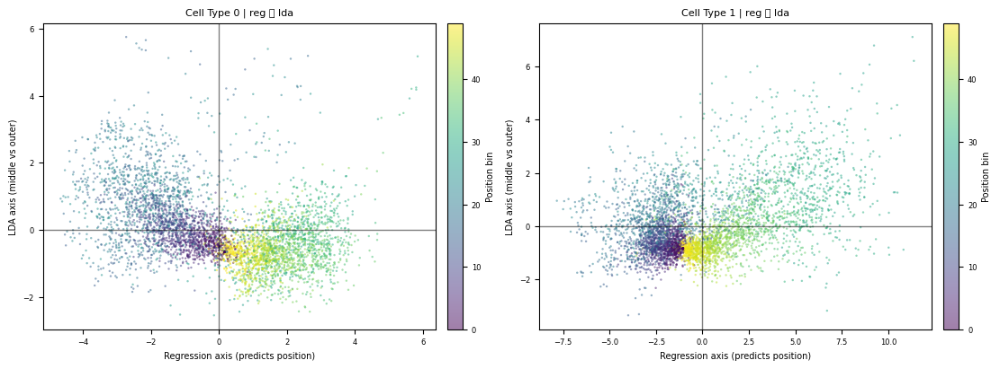

In [112]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import Ridge

def pca3_then_reg_vs_lda_allpoints_plot(
    X, n_trials, n_pos, mid_lo=15, mid_hi=35,
    baseline_subtract=True, ridge_alpha=1.0,
    orthogonalize_reg_to_lda=True,
    title="", ax=None
):
    """
    PCA(3) on all samples -> Z3 (N,3)
    LDA axis separates middle vs outer -> y (N,)
    Regression axis predicts position -> x (N,)
    Optionally orthogonalize regression axis to LDA axis (recommended)
    """
    Xn = X.detach().cpu().numpy() if hasattr(X, "detach") else (
         X.cpu().numpy() if hasattr(X, "cpu") else np.asarray(X))

    N = n_trials * n_pos
    assert Xn.shape[0] == N, f"Expected {N} rows but got {Xn.shape[0]}"

    pos_idx = np.tile(np.arange(n_pos), n_trials).astype(int)

    # --- PCA(3) ---
    pca = PCA(n_components=3)
    Z3 = pca.fit_transform(Xn)   # (N,3)

    # --- baseline subtract per trial (in PCA space) ---
    if baseline_subtract:
        Ztp = Z3.reshape(n_trials, n_pos, 3)
        Ztp = Ztp - Ztp[:, :1, :]
        Z3  = Ztp.reshape(N, 3)

    # center
    Zc = Z3 - Z3.mean(axis=0, keepdims=True)

    # --- LDA labels: middle vs outer (length N) ---
    labels = np.zeros(N, dtype=int)
    labels[(pos_idx >= mid_lo) & (pos_idx < mid_hi)] = 1

    # --- LDA axis (in 3D PCA space) ---
    lda = LinearDiscriminantAnalysis()
    y = lda.fit_transform(Zc, labels).ravel()      # (N,)
    w_lda = lda.coef_[0]
    w_lda = w_lda / (np.linalg.norm(w_lda) + 1e-12)

    # flip so middle is positive
    if y[labels==1].mean() < y[labels==0].mean():
        y *= -1
        w_lda *= -1

    # --- Regression axis: predict continuous position (in same 3D PCA space) ---
    reg = Ridge(alpha=ridge_alpha)
    reg.fit(Zc, pos_idx.astype(float))
    w_reg = reg.coef_
    w_reg = w_reg / (np.linalg.norm(w_reg) + 1e-12)

    # optional: make regression axis orthogonal to LDA axis
    if orthogonalize_reg_to_lda:
        w_reg = w_reg - (w_reg @ w_lda) * w_lda
        w_reg = w_reg / (np.linalg.norm(w_reg) + 1e-12)

    x = Zc @ w_reg   # (N,)

    # flip so x increases with position
    if np.corrcoef(x, pos_idx)[0, 1] < 0:
        x *= -1
        w_reg *= -1

    # --- plot ---
    if ax is None:
        fig, ax = plt.subplots(figsize=(5,4), constrained_layout=True)
    sc = ax.scatter(x, y, c=pos_idx, cmap="viridis", s=3, alpha=0.5, linewidths=0)
    ax.set_xlabel("Regression axis (predicts position)")
    ax.set_ylabel("LDA axis (middle vs outer)")
    ax.set_title(title + (" | reg ⟂ lda" if orthogonalize_reg_to_lda else " | reg (not ⟂ lda)"))
    ax.axhline(0, color="k", lw=1, alpha=0.5)
    ax.axvline(0, color="k", lw=1, alpha=0.5)
    plt.colorbar(sc, ax=ax, fraction=0.05, pad=0.03, label="Position bin")

    return x, y, pos_idx, w_reg, w_lda, Z3


# ---- usage (two panels) ----
n_trials = 94
n_pos = 50

fig, axs = plt.subplots(1, 2, figsize=(11,4), constrained_layout=True)

x0, y0, pos0, wreg0, wlda0, Z0_3 = pca3_then_reg_vs_lda_allpoints_plot(
    X0, n_trials, n_pos, mid_lo=15, mid_hi=35,
    baseline_subtract=True, ridge_alpha=1.0,
    orthogonalize_reg_to_lda=True,
    title="Cell Type 0", ax=axs[0]
)

x1, y1, pos1, wreg1, wlda1, Z1_3 = pca3_then_reg_vs_lda_allpoints_plot(
    X1, n_trials, n_pos, mid_lo=15, mid_hi=35,
    baseline_subtract=True, ridge_alpha=1.0,
    orthogonalize_reg_to_lda=True,
    title="Cell Type 1", ax=axs[1]
)

plt.show()
